In [104]:
import pandas as pd
import os
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from scipy.stats import ecdf, mannwhitneyu
from statsmodels.stats.weightstats import ttest_ind

from utils import *

In [105]:
config = yaml.safe_load(open('/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/beads_in_zebrafish/magnetic_tweezers_SD/config.yml'))

filepath_measurements_info = config['filepath_measurements_info']
dir_plots = os.path.join(config['dir_parent'], '3_plots')  # Folder for saving plots
dir_analysis = os.path.join(config['dir_parent'], '2_analysis')  # Folder for saving analysis results
recalculate = config['recalculate']  # Whether to recalculate measurements if they already exist
pix_size = config['pix_size'] 
dt = config['dt']  # Time step in seconds

force_ranges = config['force_ranges']  # Force ranges for averaging curves
subtract_backgroung = config['subtract_background']  # Whether to subtract background from displacement
mt_codes = config['mt_codes']
conditions = config['conditions']

creep_only = False
if config['fit_type'] == 'creep jeff':
    creep_only = True  # If the fit type is 'creep jeff', we only plot creep curves
    
creep_only_label = '_only_creep' if creep_only else ''

displacement_column = 'CORRECTED DISPLACEMENT [um]' if subtract_backgroung else 'DISPLACEMENT [um]'  # Use the original displacement, not corrected
subtr_bck_label = 'subtr_bck' if subtract_backgroung else 'no_subtr_bck'

In [106]:
# load data
df_results_all = pd.read_csv(dir_plots + f'/results/results_material_properties_{subtr_bck_label}.csv')
df_results_all.sort_values(by='MT_STATUS', ascending=False, inplace=True)
df_results_all.head(10)

,Unnamed: 0,file,EXPERIMENT,EMBRYO,TRACK_ID,PULSE_NUMBER,MT_STATUS,AVG_FORCE,k,eta_1,...,R_SQUARED_smooth,R_SQUARED_fit,rising_dif,relaxing_dif,rising_dif_norm,rising_dif_norm_inverse,relative_dif,tau_r,a,elastic_viscous_ratio
413,413,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,5,4,y,46.083037,36.075802,53.621539,...,0.989448,0.973740,3.569704,-0.848308,0.077462,12.909483,0.237641,0.743179,0.337621,0.509710
440,440,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,8,y,41.842843,58.581213,74.214079,...,0.846624,0.540990,1.097363,-0.489148,0.026226,38.130372,0.445749,0.633429,0.624674,1.664353
433,433,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,4,14,y,48.803516,31.327107,58.509186,...,0.992785,0.962391,4.221564,-1.185799,0.086501,11.560530,0.280891,0.933843,0.332578,0.498303
434,434,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,2,y,40.709426,29.516179,51.747933,...,0.966121,0.889084,1.553056,-0.942259,0.038150,26.212472,0.606713,0.876603,0.835692,5.086131
435,435,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,3,y,41.088669,21.941695,46.039598,...,0.985464,0.912627,3.157980,-1.197316,0.076858,13.011062,0.379140,1.049135,0.545045,1.198018
436,436,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,4,y,41.451847,32.915042,65.504989,...,0.970470,0.903149,2.433788,-1.069200,0.058714,17.031820,0.439315,0.995062,0.453880,0.831098
437,437,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,5,y,41.645761,35.066886,59.655882,...,0.967981,0.954094,1.357454,-0.784166,0.032595,30.679322,0.577674,0.850601,0.813061,4.349338
438,438,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,6,y,41.704378,41.248698,70.510151,...,0.947053,0.901078,1.154509,-0.809231,0.027683,36.123054,0.700932,0.854695,0.793728,3.847958
439,439,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,7,y,41.715924,65.076276,101.506341,...,0.810453,0.625475,0.617224,-0.306064,0.014796,67.586352,0.495871,0.779903,0.939913,15.642544
441,441,20240711_s01p01t03_2_5sON_15sOFF_spots_extende...,20240711s01p01t03,20240711s01p01,2,9,y,42.128048,31.235431,65.949081,...,0.936073,0.913610,1.335789,-1.149227,0.031708,31.537959,0.860336,1.055677,0.854668,5.880779


# General overview

In [107]:
N_tracks = len(df_results_all)
N_tracks_i = len(df_results_all[df_results_all['MT_STATUS']==mt_codes[0]])
N_tracks_m = len(df_results_all[df_results_all['MT_STATUS']==mt_codes[1]])
print(f'We have in total {N_tracks} full tracks. \nOut of which:\n - {conditions[0]}: {N_tracks_i} \n - {conditions[1]}: {N_tracks_m} ')

We have in total 827 full tracks. 
Out of which:
 - Interphase: 440 
 - M-phase: 387 


# The data that is still left after filtering 

We removed:
- the data with relative recovery 


In [108]:
df_results_filtered = filter_based_on_recovery(df_results_all, mt_codes)
print(f'After filtering for two sigma recovery, we are left with {100*len(df_results_filtered)/len(df_results_all)}% of the data')

print(f'{100*len(df_results_filtered[df_results_filtered['MT_STATUS']==mt_codes[0]])/len(df_results_all[df_results_all['MT_STATUS']==mt_codes[0]])}% in {conditions[0]}')
print(f'{100*len(df_results_filtered[df_results_filtered['MT_STATUS']==mt_codes[1]])/len(df_results_all[df_results_all['MT_STATUS']==mt_codes[1]])}% in {conditions[1]}')

y [-0.09166828  1.4739487 ]
n [-0.27721331  2.5650715 ]
After filtering for two sigma recovery, we are left with 98.79081015719468% of the data
98.63636363636364% in Interphase
98.96640826873384% in M-phase


In [109]:
dict_embr = {embr: int(i+1) for (i, embr) in enumerate(df_results_all['EMBRYO'].unique())}
print(dict_embr)

df_results_filtered['EMBRYO'] = df_results_filtered['EMBRYO'].map(dict_embr)

{'20240711s01p01': 1, '20240705s03p01': 2, '20240621s02p02': 3, '20240523s02p01': 4, '20240705s01p01': 5, '20240621s01p01': 6, '20240705s02p01': 7, '20240614s02p02': 8, '20240621s02p01': 9, '20240703s03p01': 10, '20240618s01p02': 11, '20240523s01p01': 12}


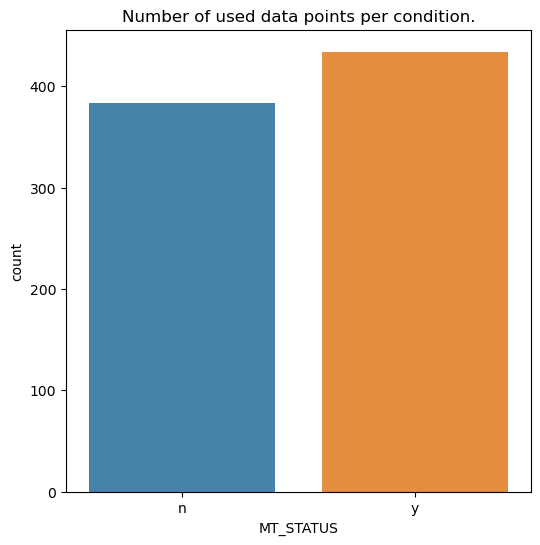

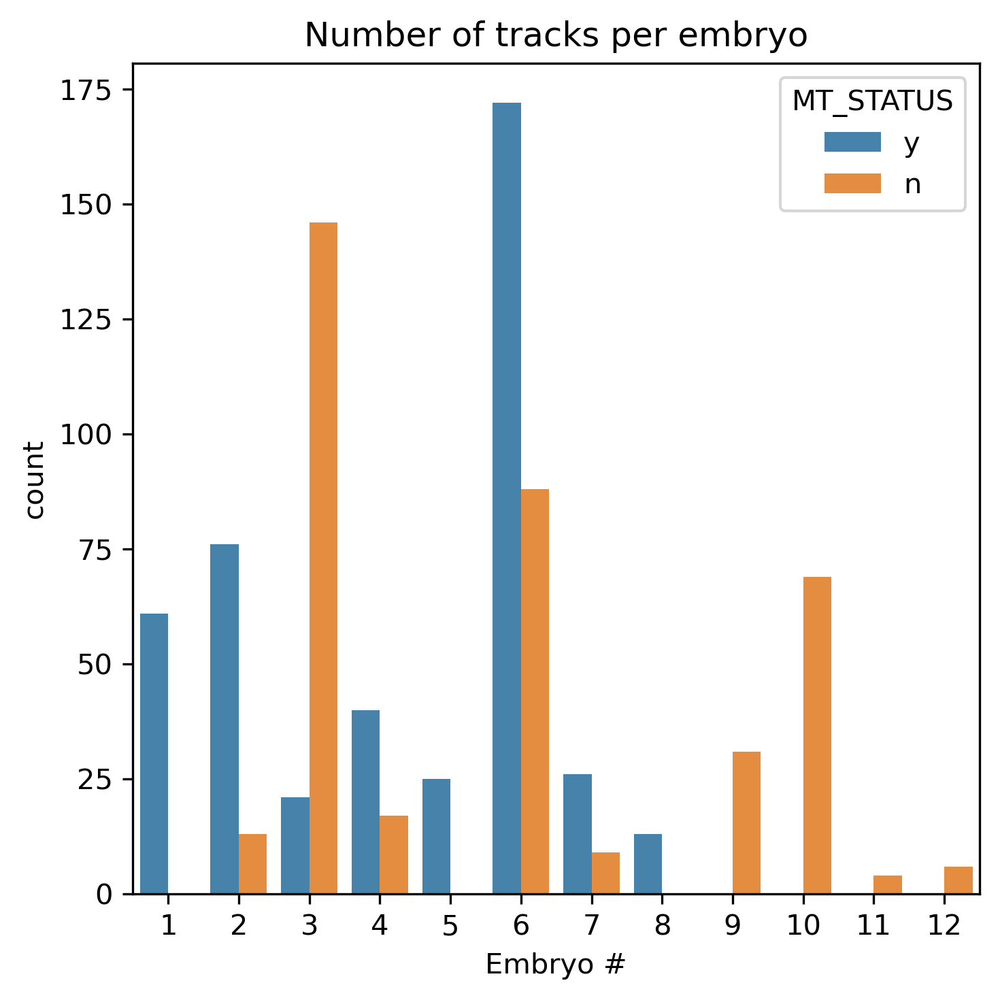

In [110]:
fig = plt.figure(figsize=(6, 6))
# Second subplot: Summary statistics

sns.countplot(data=df_results_filtered, x='MT_STATUS', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of used data points per condition.')
plt.show()

fig = plt.figure(figsize=(5, 5), dpi=300)
df_results_filtered = df_results_filtered.sort_values(by='EMBRYO', ascending=True)

sns.countplot(data=df_results_filtered, x='EMBRYO', hue='MT_STATUS', alpha=0.9)
plt.title(f'Number of tracks per embryo')
plt.xticks()
plt.xlabel('Embryo #')
plt.tight_layout()
plt.savefig('/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/3_plots/results/auxiliary_plots_statistics/number_of_tracks_per_embryo.svg', format='svg')
plt.show()

# All data groupped together

In [111]:
# All the parameters that we are interested in with their labels for plots:

params = ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'rising_dif', 'rising_dif_norm', 'relative_dif', 'a', 'tau_r']

labels = ['$\\kappa$ (pN/$\\mathrm{\\mu m}$)', '$\\gamma_1$ (pN s/$\\mathrm{\\mu m}$)', '$\\gamma_2$ (pN s/$\\mathrm{\\mu m}$)', 'Ratio between elastic and viscous deformation', 'Displacement ($\\mathrm{\\mu m}$)', 'Displacement / Force ($\\mathrm{\\mu m}$/ pN)', 'a = Relaxation / Displacement ', 'a', '$\\tau_R$']

mapping = {'y': 'Interphase', 'n': 'M-phase'}

# Clustered data

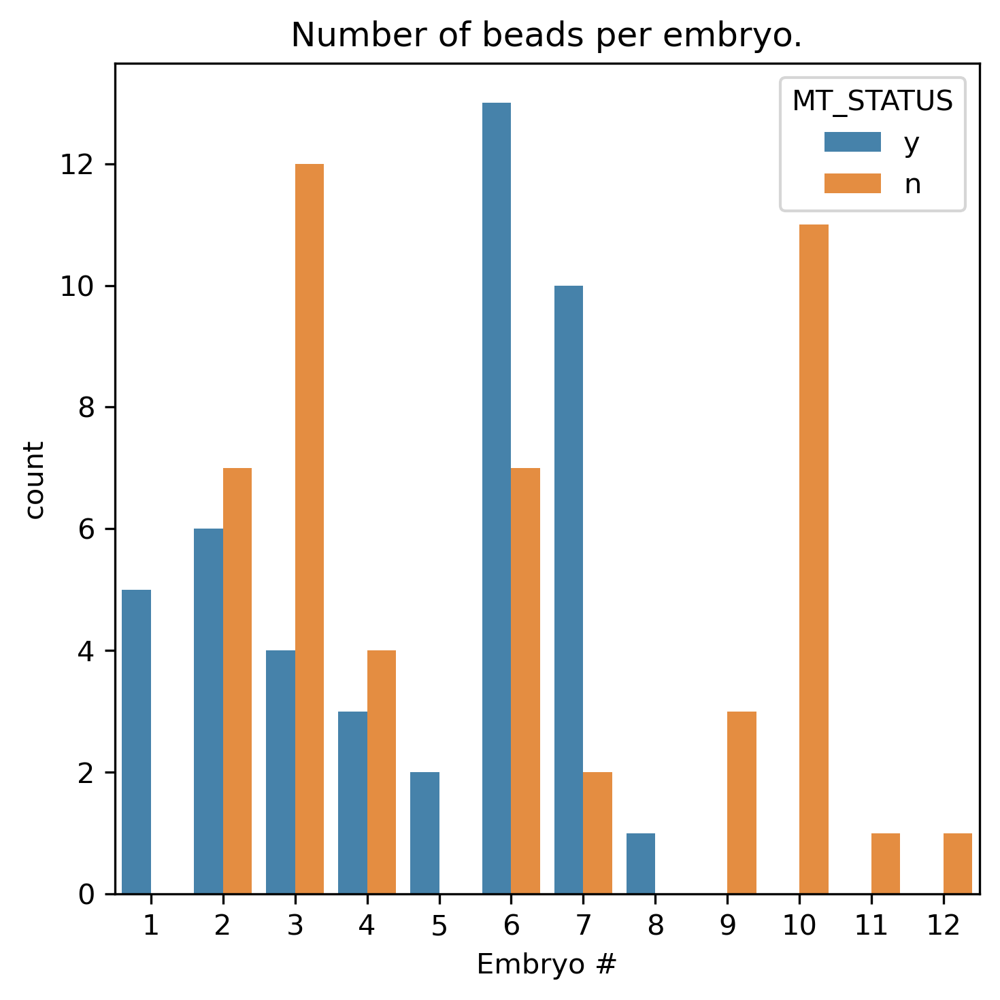

In [112]:
df_beads = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS', 'TRACK_ID']).count().reset_index()
df_beads = df_beads.sort_values(by=['EMBRYO', 'MT_STATUS'], ascending=False)

fig = plt.figure(figsize=(5, 5), dpi=300)

sns.countplot(data=df_beads, x='EMBRYO', hue='MT_STATUS', alpha=0.9)
plt.xticks()
plt.xlabel('Embryo #')
plt.tight_layout()
plt.title(f'Number of beads per embryo.')
plt.tight_layout()
plt.savefig('/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/3_plots/results/auxiliary_plots_statistics/number_of_beads_per_embryo.svg', format='svg')
plt.show()

# Binned by force

## Data together with rolling average

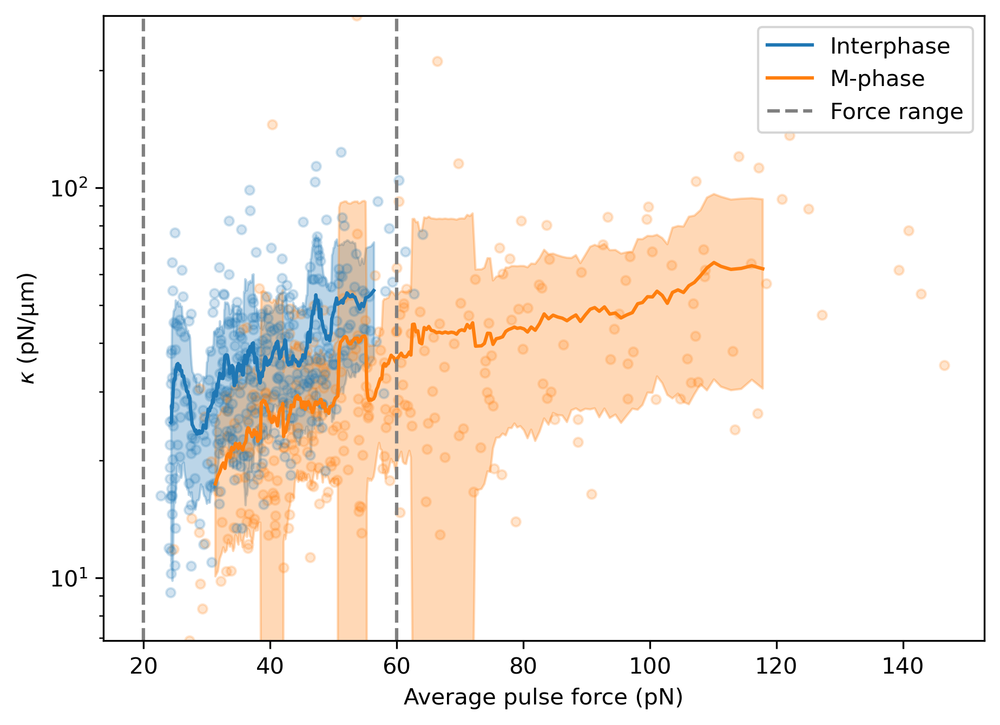

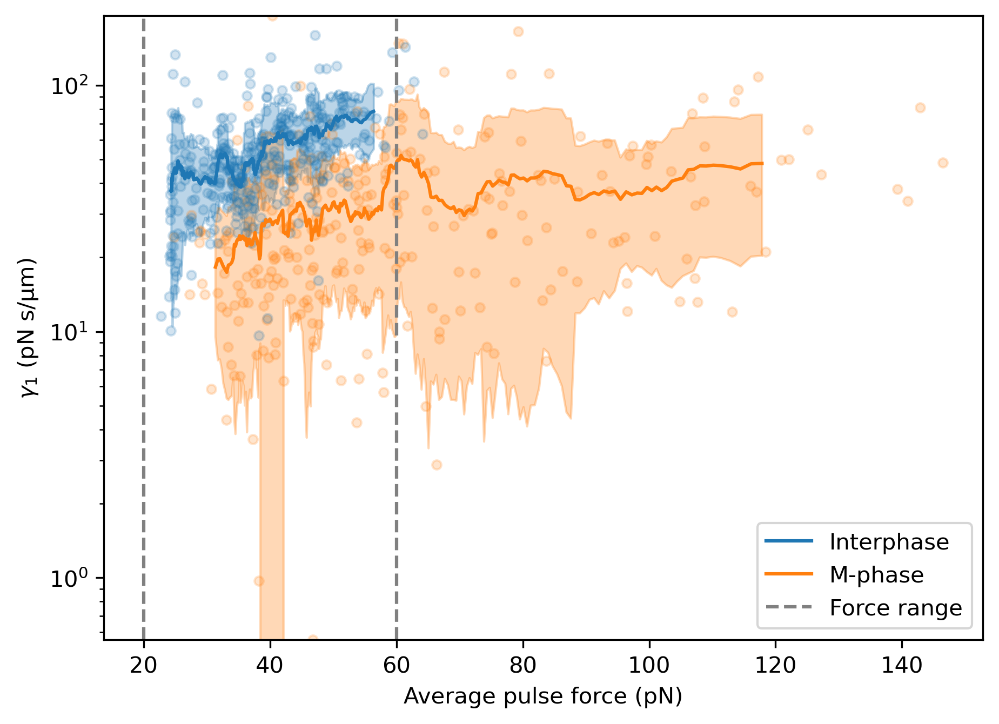

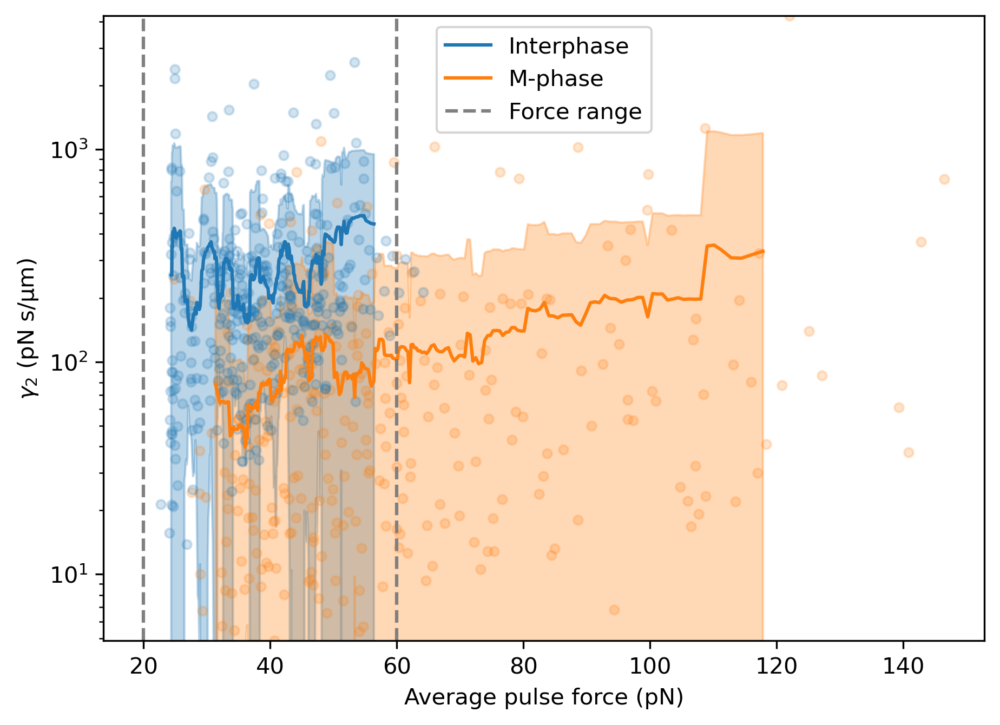

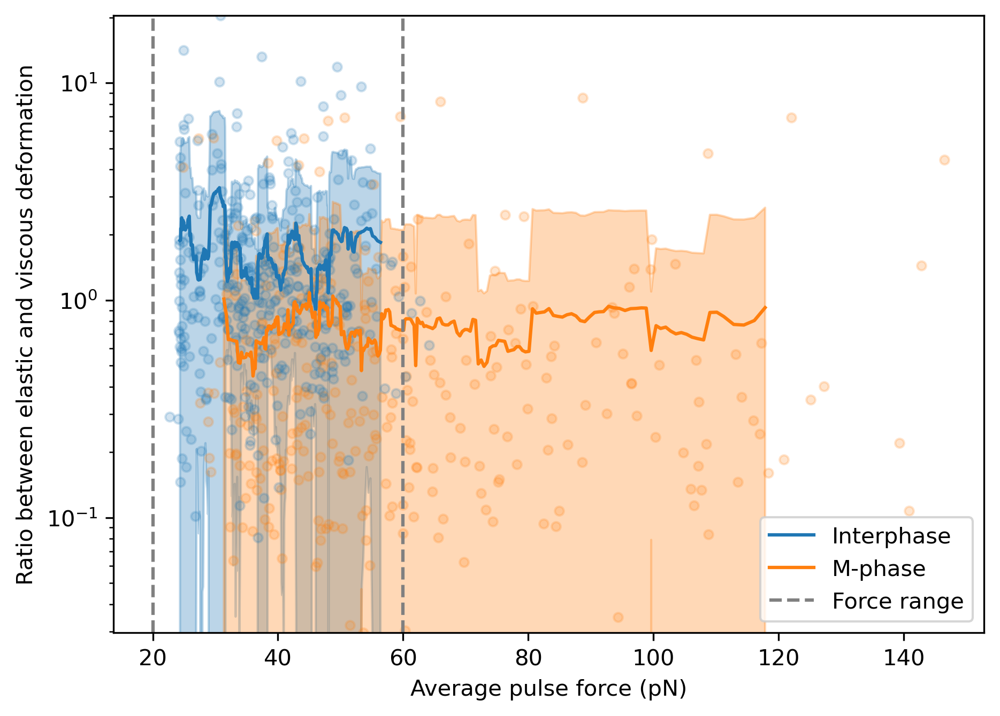

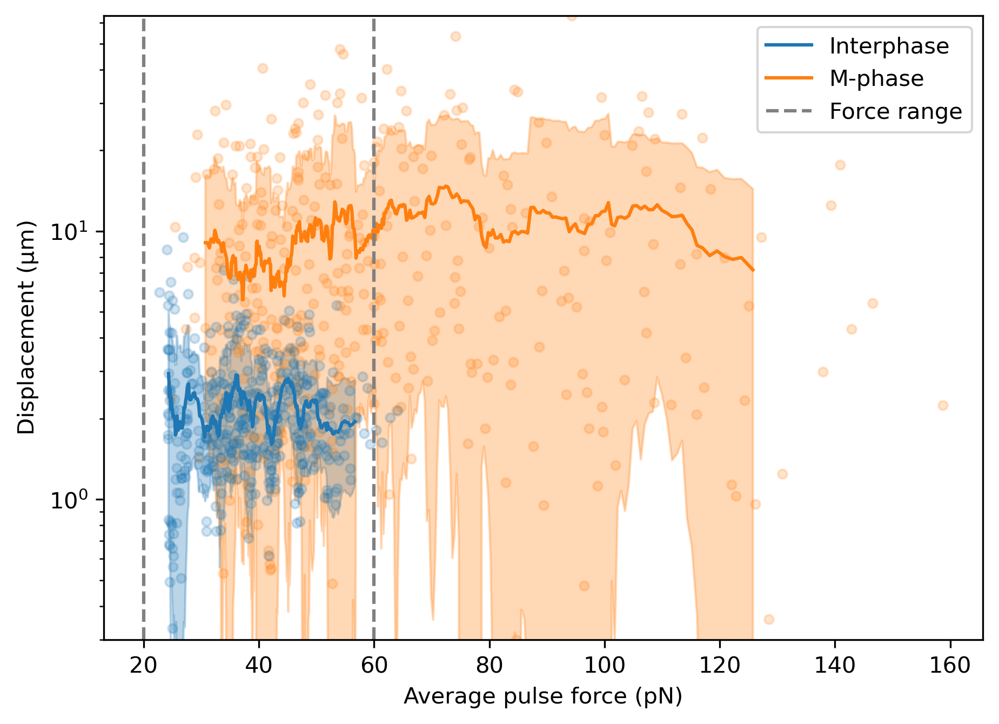

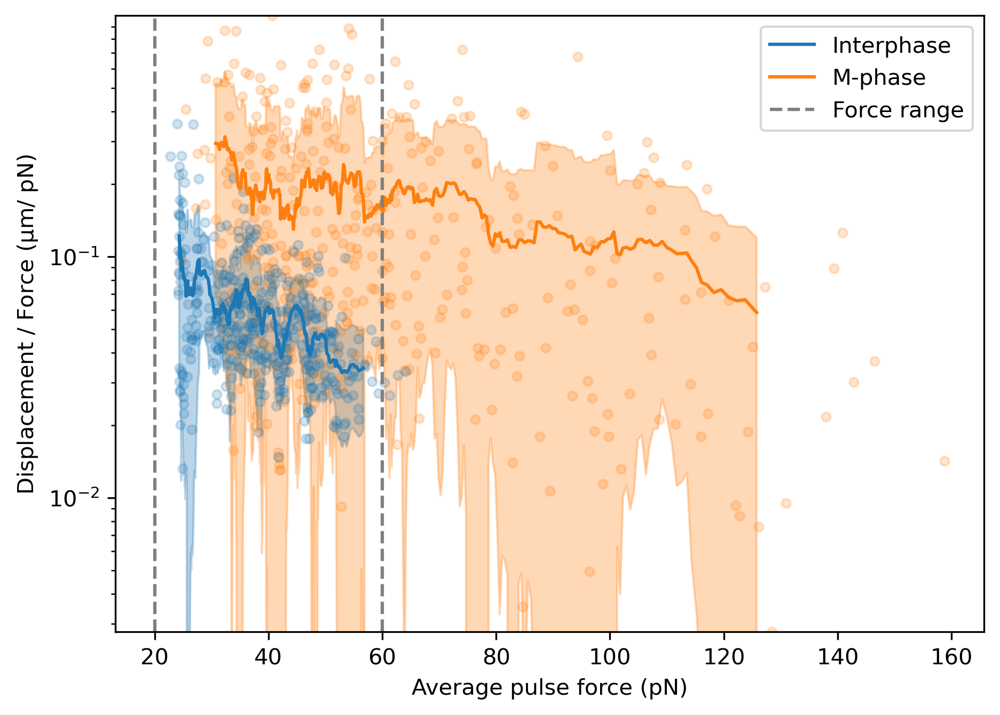

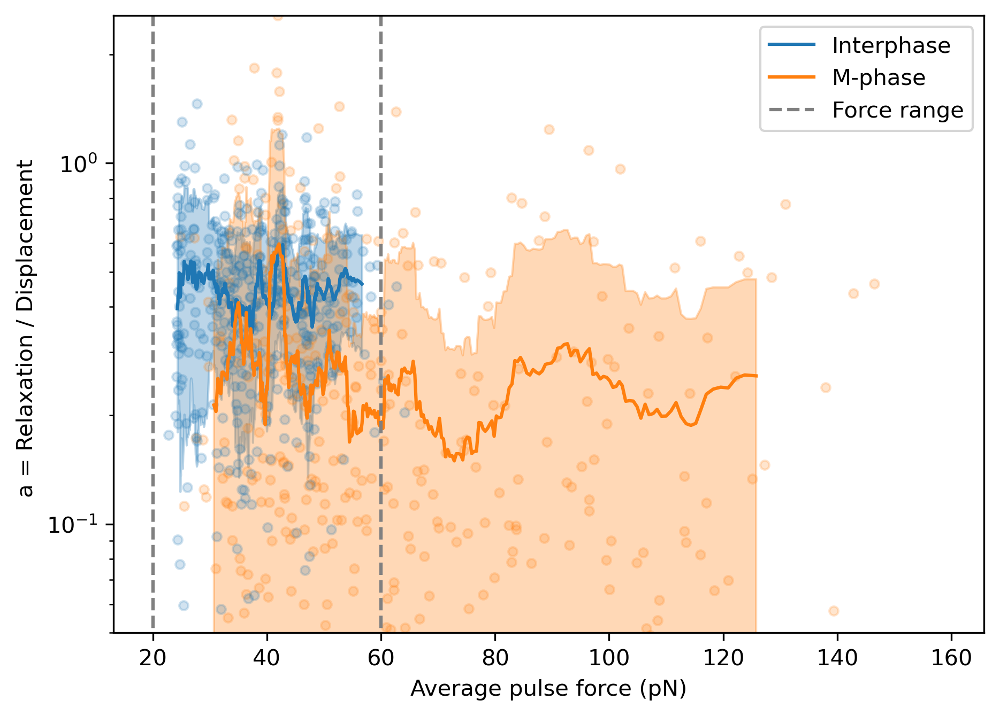

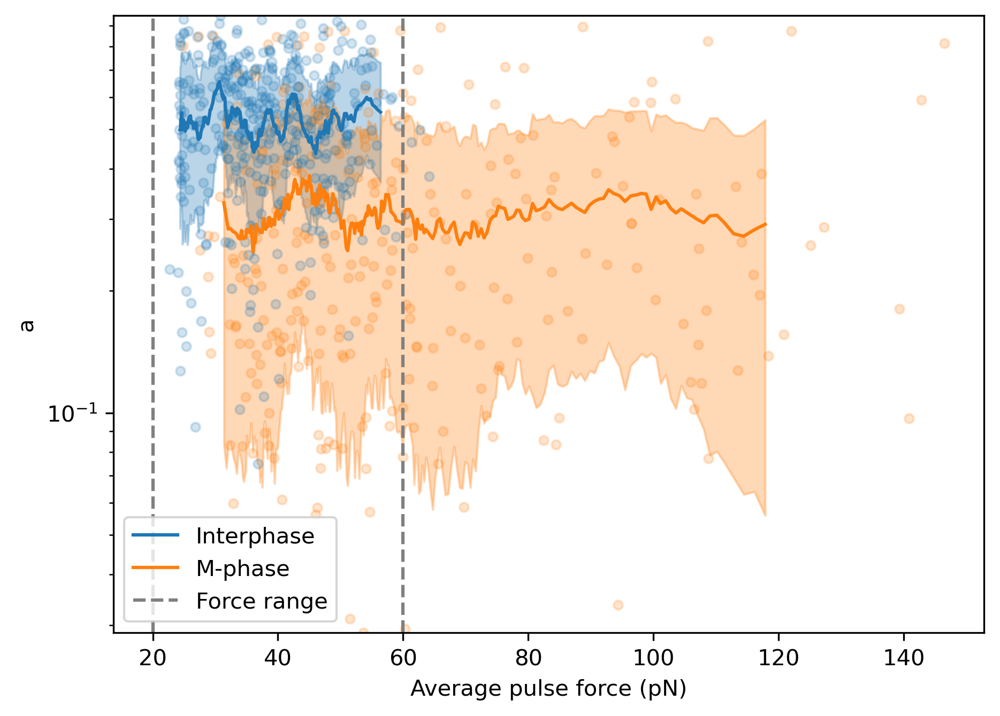

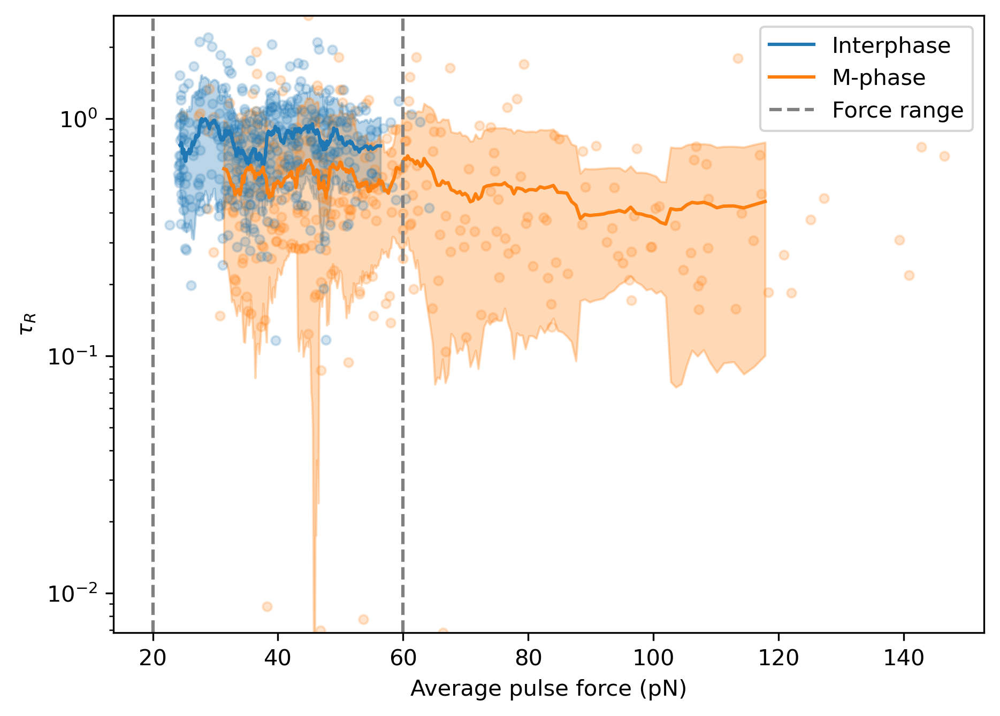

In [113]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)

    fig = plt.figure(figsize=(7, 5), dpi=300)
    # plot all data
    plt.plot(df.loc[df['MT_STATUS']=='n', 'AVG_FORCE'], df.loc[df['MT_STATUS']=='n', param], 'o', color=sns.color_palette()[1], alpha=0.2, markersize = 4)
    plt.plot(df.loc[df['MT_STATUS']=='y', 'AVG_FORCE'], df.loc[df['MT_STATUS']=='y', param], 'o', color=sns.color_palette()[0], alpha=0.2, markersize = 4)
    
    window = 25
    # plot the roling average
    plt.plot(df.loc[df['MT_STATUS']=='y', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df.loc[df['MT_STATUS']=='y', param].rolling(window=window, center=True).mean(), '-', color=sns.color_palette()[0], alpha=1, label='Interphase')

    plt.plot(df.loc[df['MT_STATUS']=='n', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df.loc[df['MT_STATUS']=='n', param].rolling(window=window , center=True).mean(), '-', color=sns.color_palette()[1], alpha=1, label='M-phase')

    # plot the standard deviation
    plt.fill_between(df.loc[df['MT_STATUS']=='y', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).mean()- df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).std(), 
    df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).mean()+ df.loc[df['MT_STATUS']==mt_codes[0], param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[0], alpha=0.3)

    plt.fill_between(df.loc[df['MT_STATUS']=='n', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).mean()- df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).std(), 
    df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).mean()+ df.loc[df['MT_STATUS']==mt_codes[1], param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[1], alpha=0.3)

    plt.vlines(x=force_ranges, ymin=df[param].min(), ymax=df[param].max(), color='gray', linestyle='--', label='Force range')


    plt.xlabel('Average pulse force (pN)')
    plt.legend()
    plt.ylabel(label)
    plt.ylim(df[param].min(), df[param].max())
    if param == 'relative_dif':
        plt.ylim(bottom=0.05)
    plt.yscale('log')
    plt.savefig(f'/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/3_plots/results/auxiliary_plots_statistics/force_dependence_{param}.png')
    plt.show()



/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_59728/536190179.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_binned_force['EMBRYO'] = df_binned_force['EMBRYO'].map(dict_embr)


We have in total 674 full tracks. 
Out of which:
 - Interphase: 436 
 - M-phase: 238 


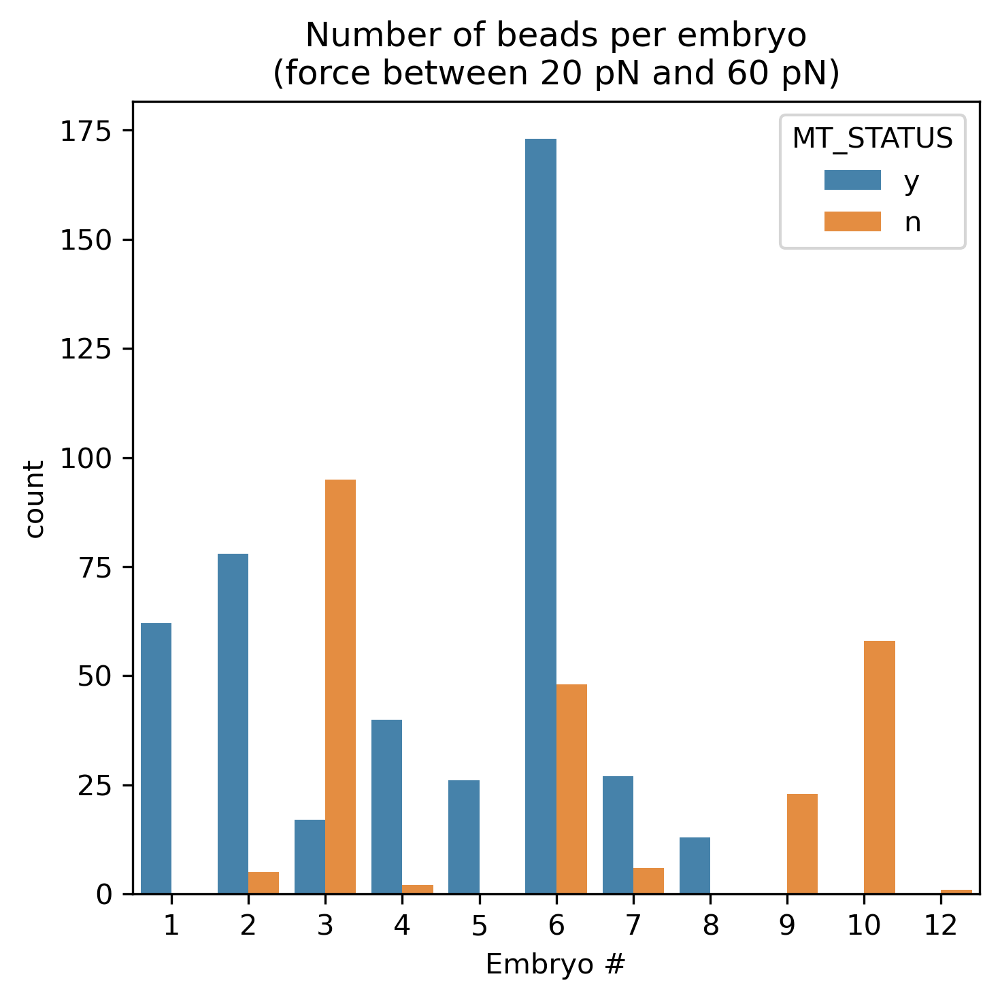

In [123]:
df_binned_force = df_results_all[(df_results_all['AVG_FORCE']>force_ranges[0][0])&(df_results_all['AVG_FORCE']<force_ranges[0][1])]

df_binned_force['EMBRYO'] = df_binned_force['EMBRYO'].map(dict_embr)

N_tracks = len(df_binned_force)
N_tracks_i = len(df_binned_force[df_binned_force['MT_STATUS']==mt_codes[0]])
N_tracks_m = len(df_binned_force[df_binned_force['MT_STATUS']==mt_codes[1]])
print(f'We have in total {N_tracks} full tracks. \nOut of which:\n - {conditions[0]}: {N_tracks_i} \n - {conditions[1]}: {N_tracks_m} ')

fig = plt.figure(figsize=(5, 5), dpi=300)

sns.countplot(data=df_binned_force, x='EMBRYO', hue='MT_STATUS', alpha=0.9)
plt.xticks()
plt.xlabel('Embryo #')
plt.title(f'Number of beads per embryo\n(force between 20 pN and 60 pN)')
plt.tight_layout()
plt.savefig('/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/3_plots/results/auxiliary_plots_statistics/number_of_tracks_per_embryo_force_range.svg', format='svg')
plt.show()

# Histograms of binned force data

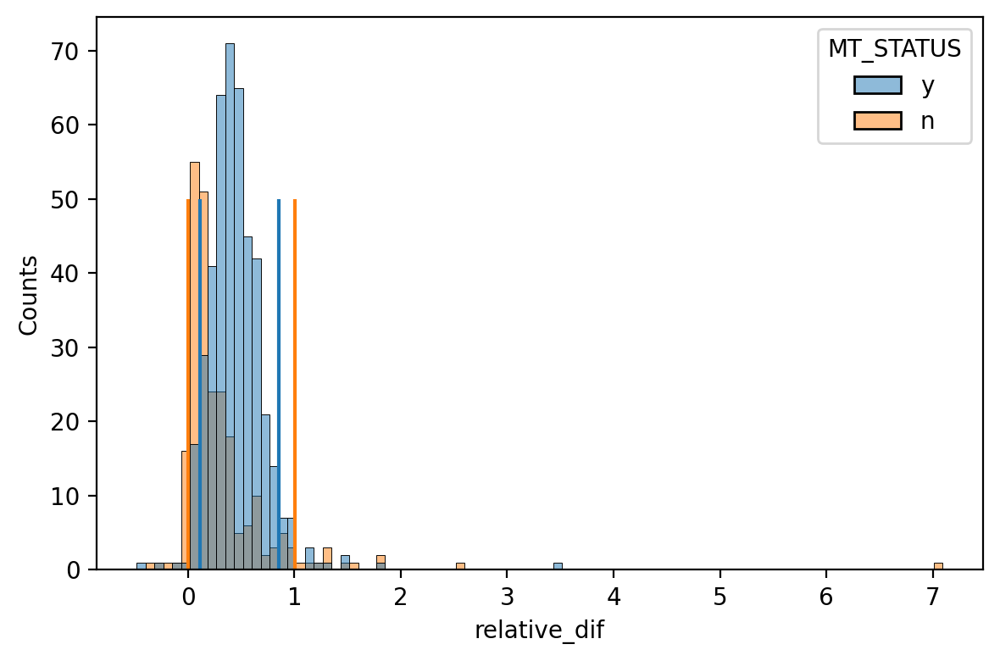

In [115]:

# for (param, label) in zip(params, labels):

param = 'relative_dif'
fig = plt.figure(figsize=(6, 4), dpi=200)
df_binned_force = df_results_all[(df_results_all['AVG_FORCE']>force_ranges[0][0])&(df_results_all['AVG_FORCE']<force_ranges[0][1])]
# Compute mean and standard deviation
for (mt_status, color) in zip(['y', 'n'], [sns.color_palette()[0], sns.color_palette()[1]]):
    values = df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param]
    ci = np.percentile(values, [5, 95])
    plt.vlines(ci[0], 0, 50, color=color)
    plt.vlines(ci[1], 0, 50, color=color)

sns.histplot(df_binned_force, x=param, hue='MT_STATUS')
plt.xlabel(param)
plt.ylabel('Counts')
plt.tight_layout()
plt.savefig(f'{dir_plots}/results/auxiliary_plots_statistics/result_histogram_{param}.svg', format='svg')
plt.show()

# Confidence intervals and p values of parameters

In [116]:
df_data_stats = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).median(numeric_only=True).reset_index()
df_data_stats['group_size'] = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).size().values

rng = np.random.default_rng()
df_params_stats = pd.DataFrame()
p_values = dict()

for param in params:
    df_binned_force = df_data_stats
    for mt_status in ['y', 'n']:

        weights=df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, 'group_size'].values
        weighted_average, ci = weighted_bootstrap(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

        new_line = {'parameter': param, 
                    'weighted_average': weighted_average,
                    'conf_int_low': ci[0], 
                    'conf_int_high': ci[1],
                    'y_err_low': weighted_average - ci[0],
                    'y_err_high': ci[1] - weighted_average,
                    'MT_STATUS': mt_status
                    }
        df_params_stats = pd.concat([df_params_stats, pd.DataFrame(new_line, index=[0])])

    res = ttest_ind(df_binned_force.loc[df_binned_force['MT_STATUS']=='n', param].values, 
                    df_binned_force.loc[df_binned_force['MT_STATUS']=='y', param].values, alternative='two-sided', usevar='unequal')
    pval = res[1]
    
    p_values[param] = pval


df_params_stats.head(20)
df_params_stats.to_csv(f'{dir_plots}/results/results_material_properies_stats_{subtr_bck_label}.csv', index=False)

In [117]:
df_results_from_average_curves = pd.read_csv(f'{dir_plots}/results/results_parameters_curve_averaged_force_range{force_ranges[0][0]}-{force_ranges[0][1]}pN_{subtr_bck_label}{creep_only_label}.csv')
df_results_from_average_curves['group_size'] = df_results_from_average_curves .groupby(['EMBRYO', 'MT_STATUS']).size().values

df_params_avg_curves_stats = pd.DataFrame()

p_values_avg_curves = dict()

for param in params:
    if param in df_results_from_average_curves.columns:
        weights_ = set()
        for mt_status in ['y', 'n']:

            weights=df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, 'group_size'].values
            weighted_average, ci = weighted_bootstrap(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

            new_line = {'parameter': param, 
                        'weighted_average': weighted_average,
                        'conf_int_low': ci[0], 
                        'conf_int_high': ci[1],
                        'y_err_low': weighted_average - ci[0],
                        'y_err_high': ci[1] - weighted_average,
                        'MT_STATUS': mt_status
                        }
            df_params_avg_curves_stats = pd.concat([df_params_avg_curves_stats, pd.DataFrame(new_line, index=[0])])


        weights = (df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', 'COUNT'].values*len(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', 'COUNT'].values)/np.sum(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', 'COUNT'].values), 
        df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', 'COUNT'].values*len(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', 'COUNT'].values)/np.sum(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', 'COUNT'].values))

        res  = ttest_ind(
            df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='y', param].values, df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='n', param].values,  weights=weights, alternative='two-sided', usevar='unequal')
    
        pval = res[1]
    
        p_values_avg_curves[param] = pval

df_params_avg_curves_stats.to_csv(f'{dir_plots}/results/results_material_properies_avg_curves_stats_{subtr_bck_label}.csv', index=False)
# print('P-values for the parameters from the averaged curves:', p_values_avg_curves)

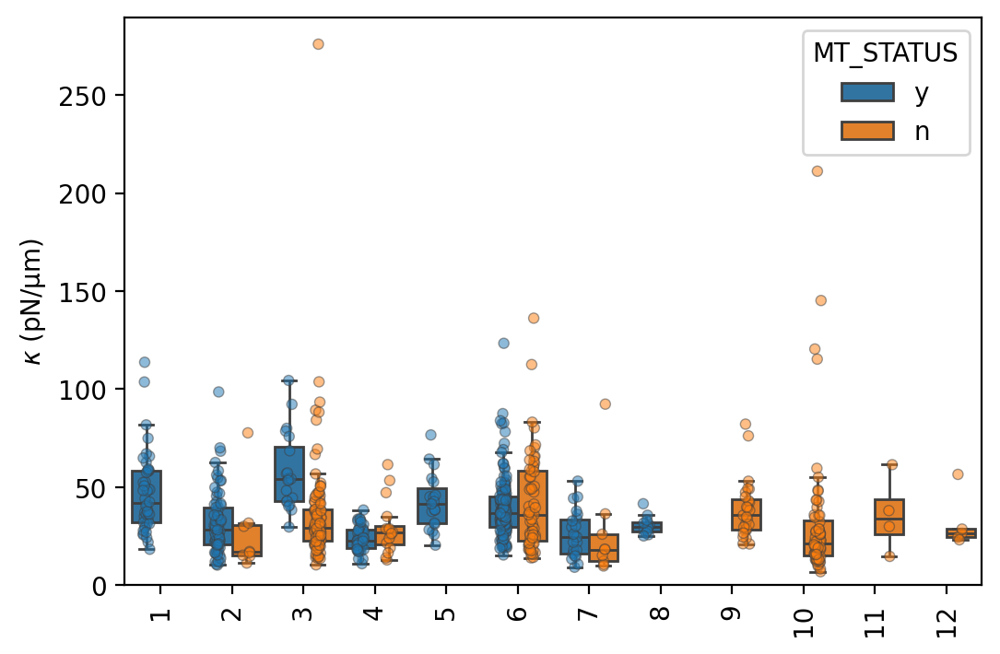

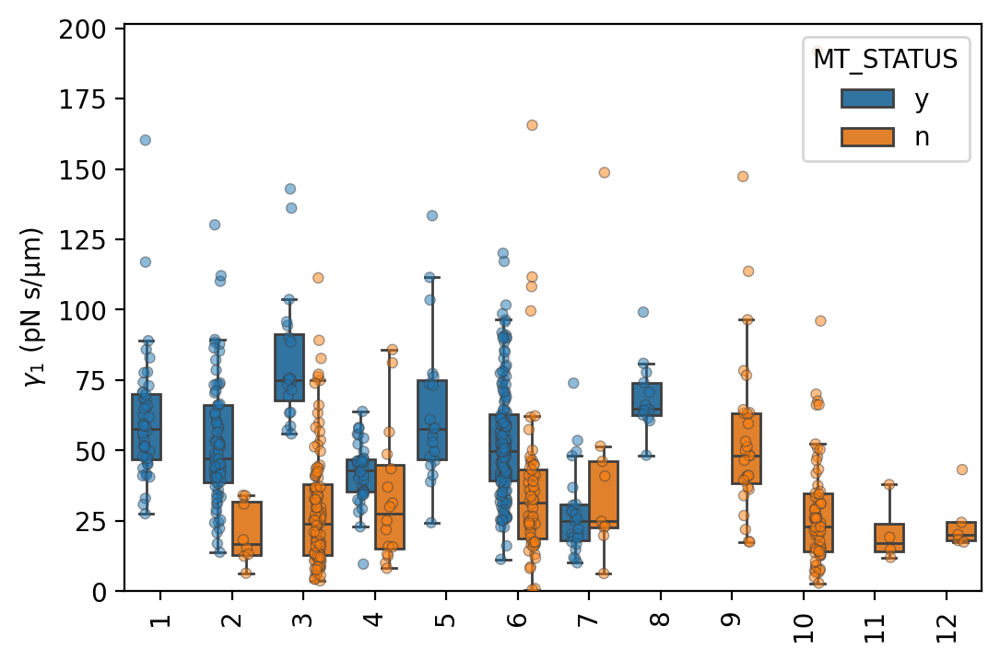

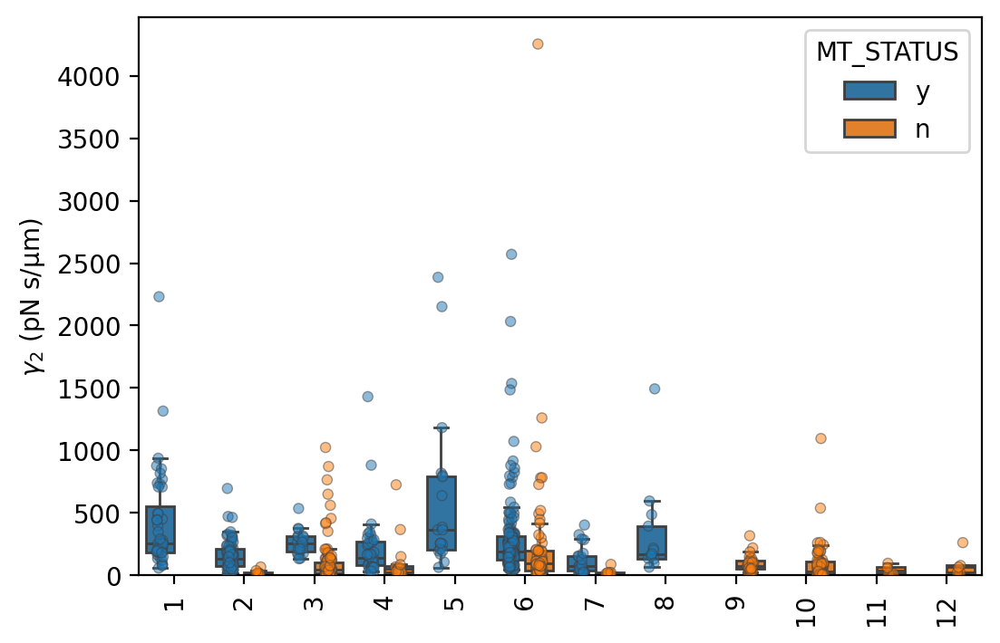

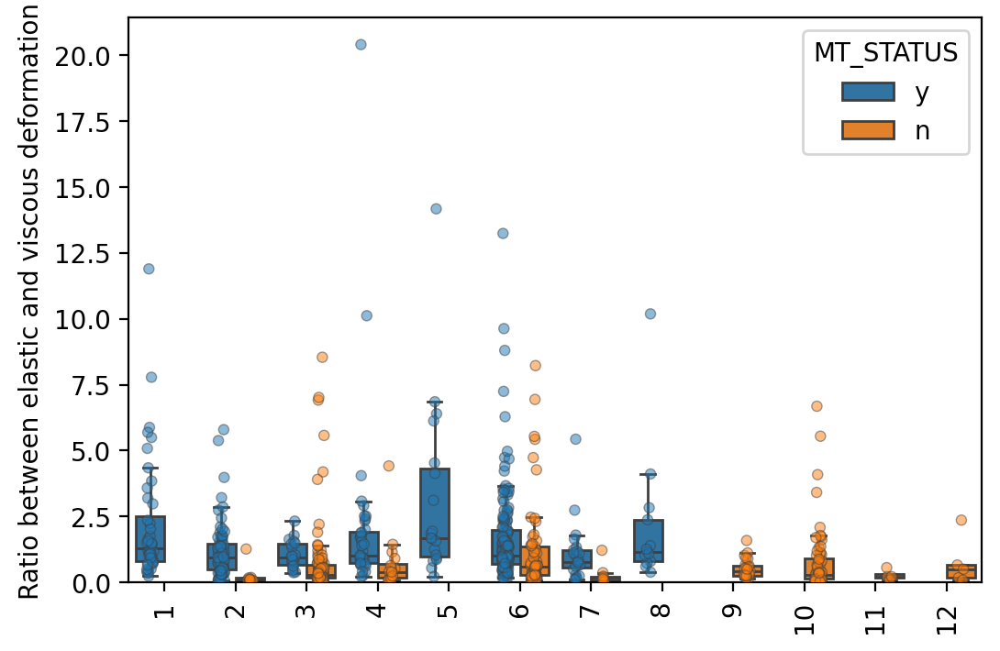

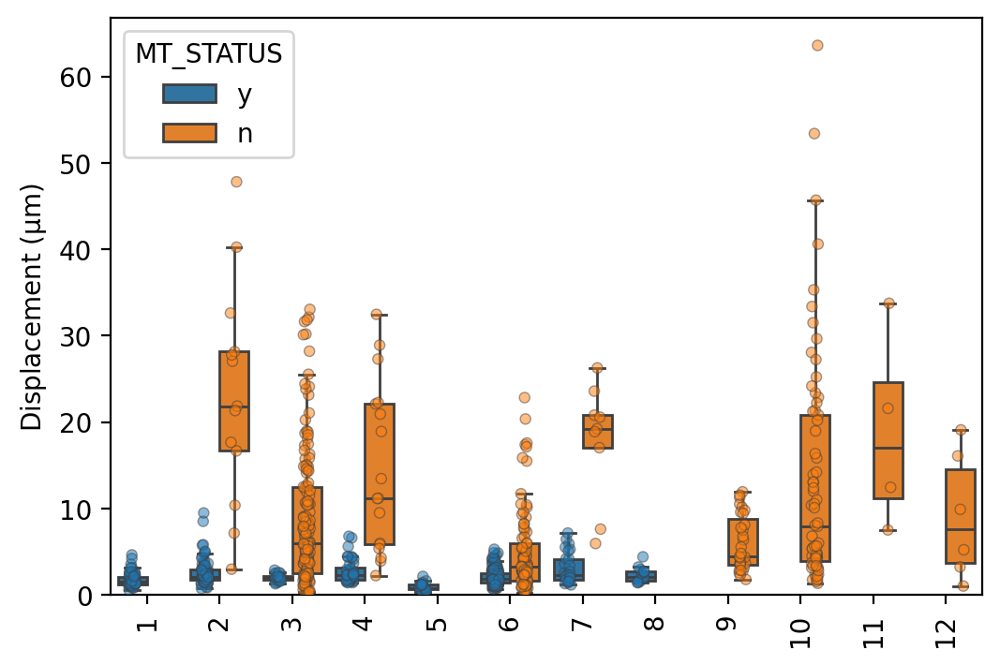

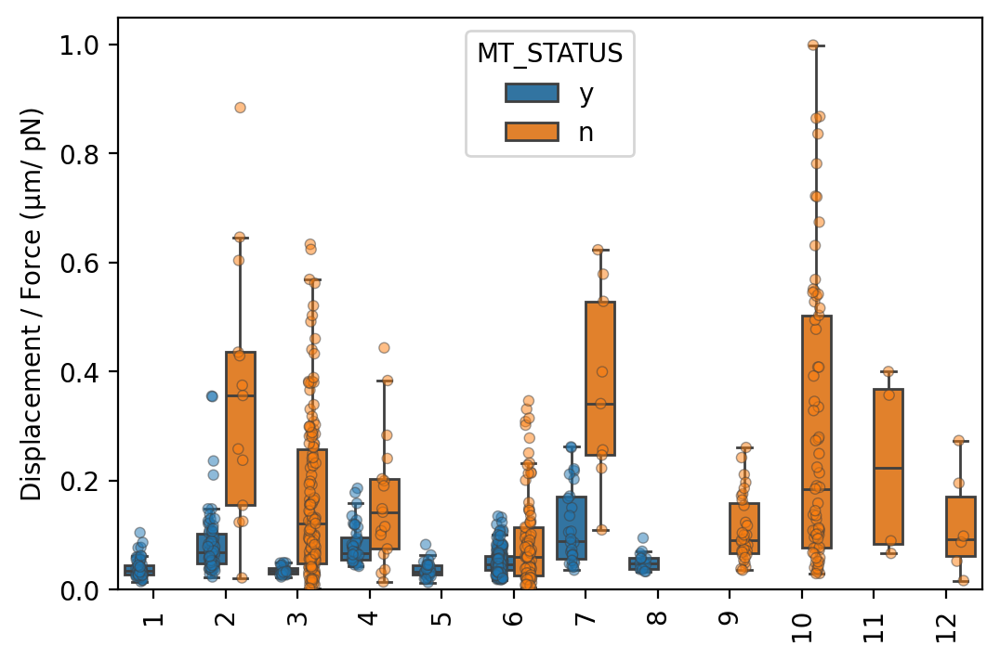

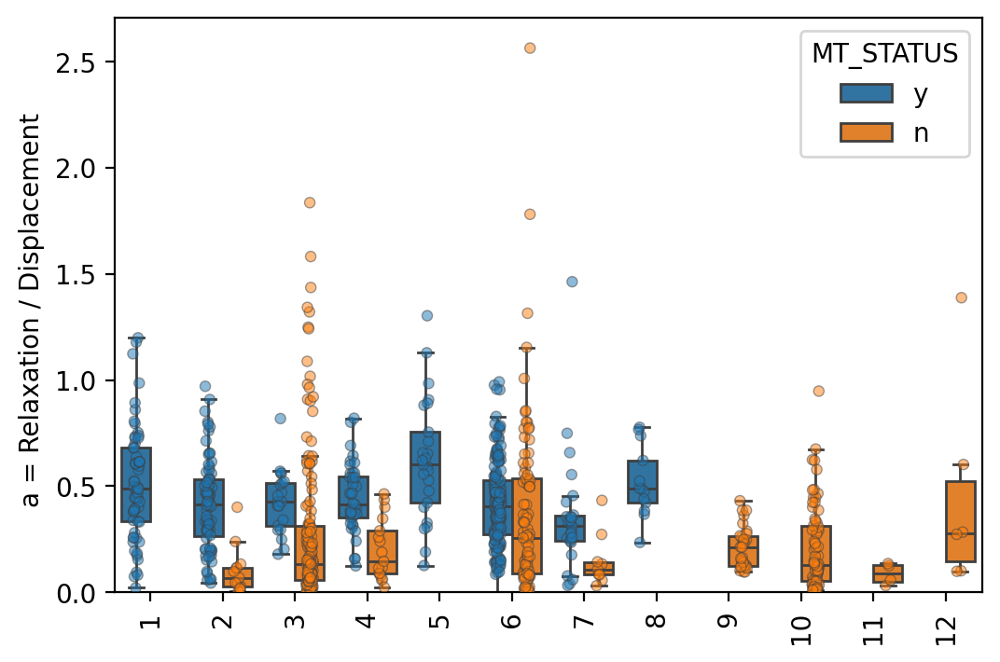

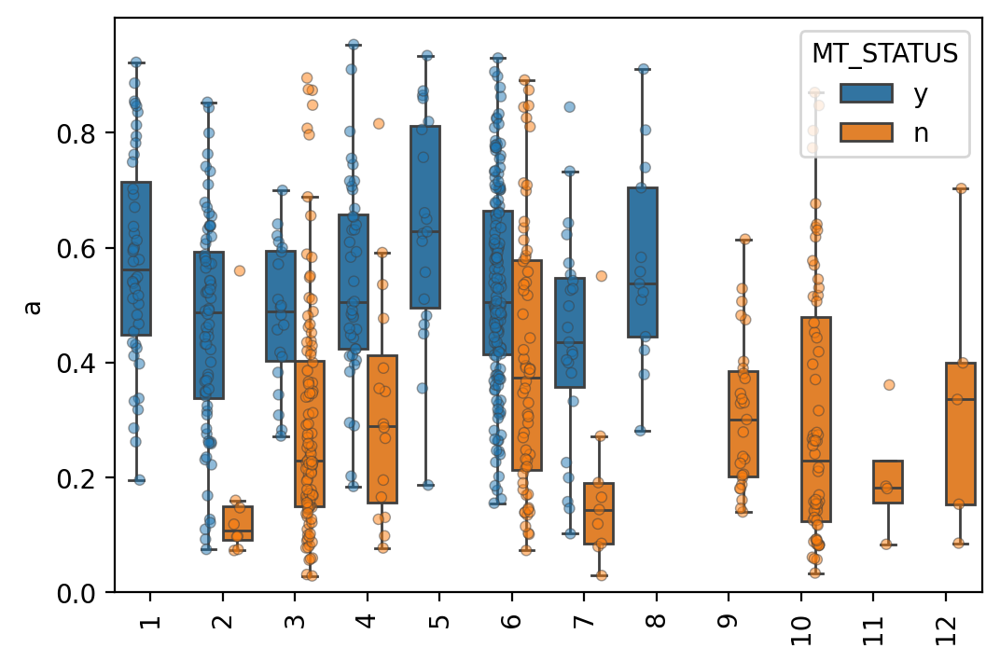

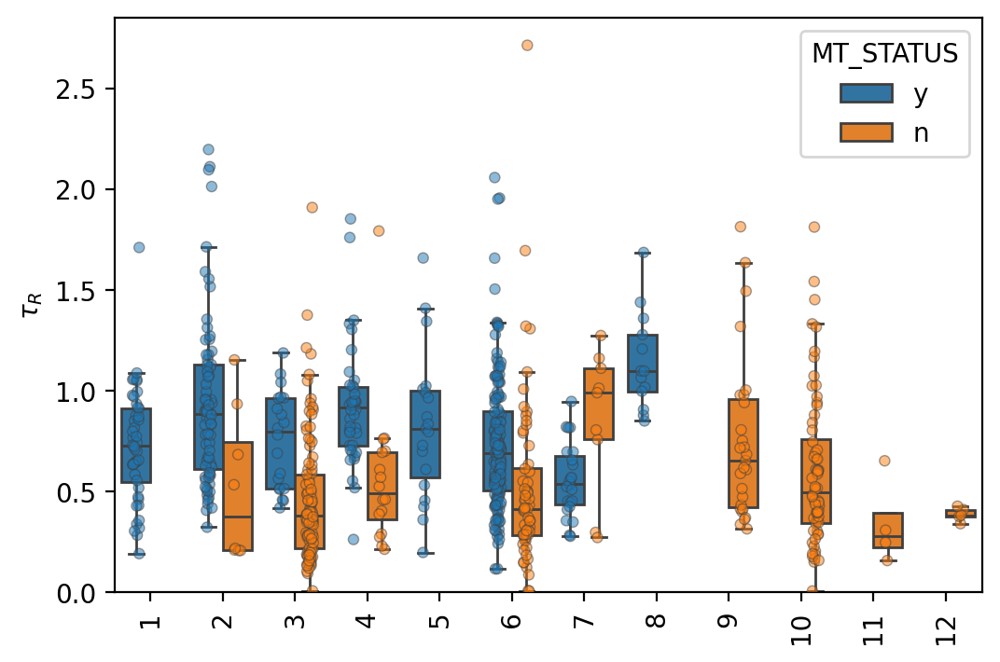

In [118]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)


for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)

    fig = plt.figure(figsize=(6, 4), dpi=200)
    sns.boxplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df, fliersize=0)
    sns.stripplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4)
    plt.xlabel('')
    plt.ylabel(label)
    plt.ylim(bottom=0)
    plt.xticks(rotation=90)
    plt.show()

## Bootstrapping the data

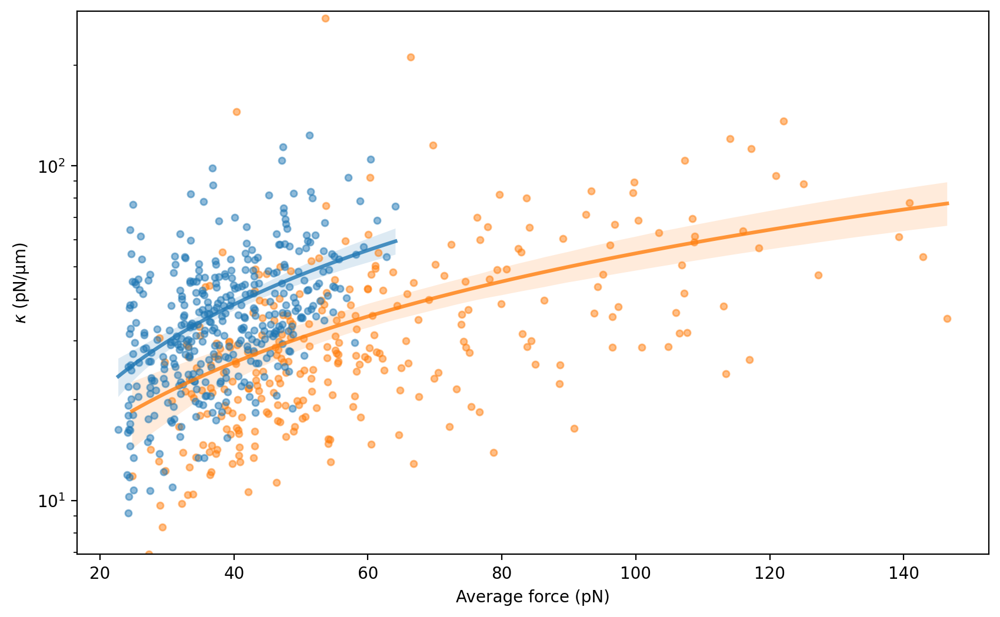

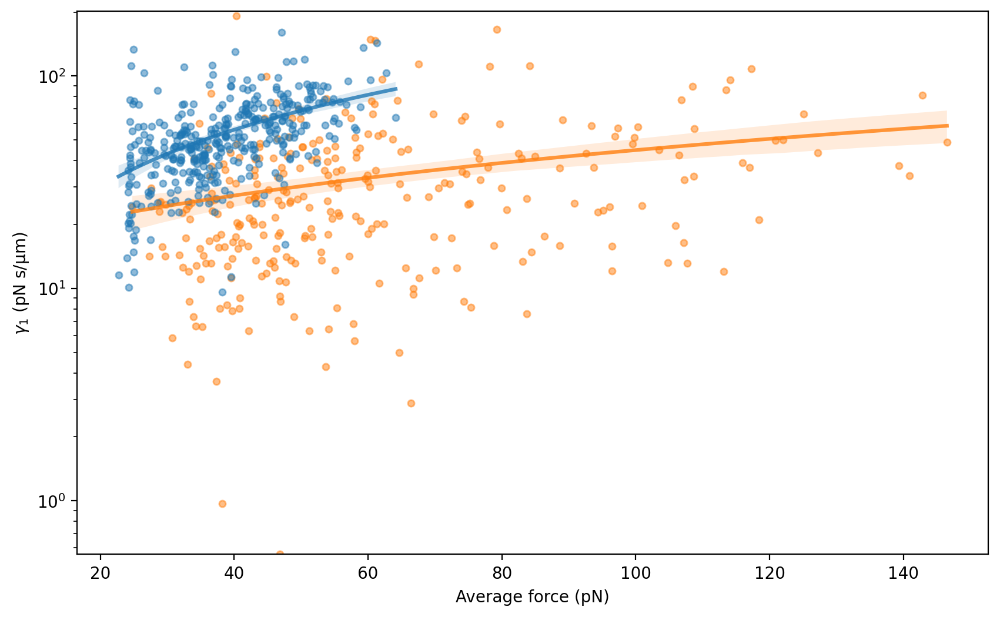

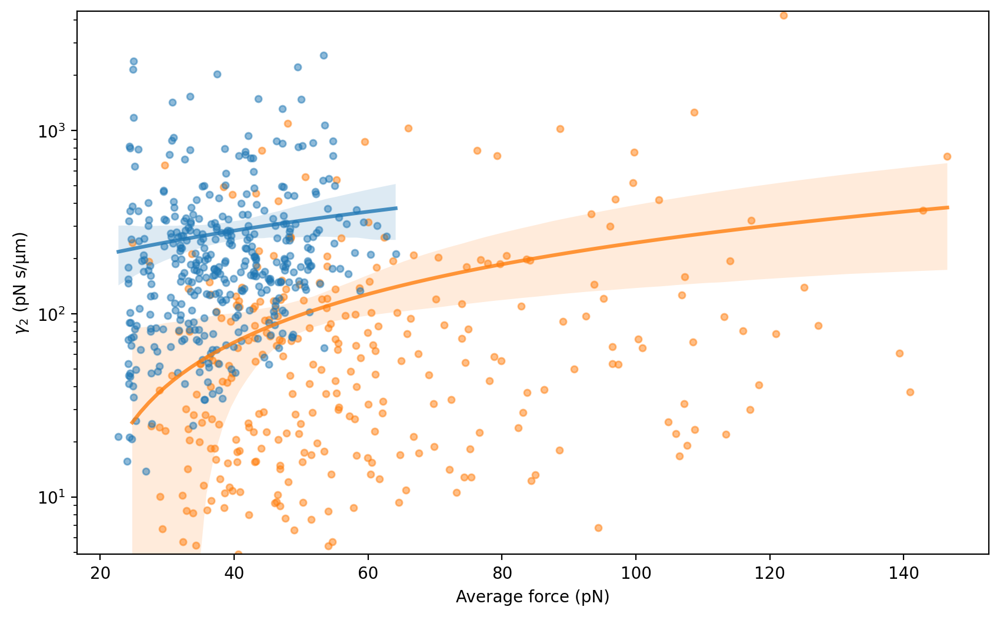

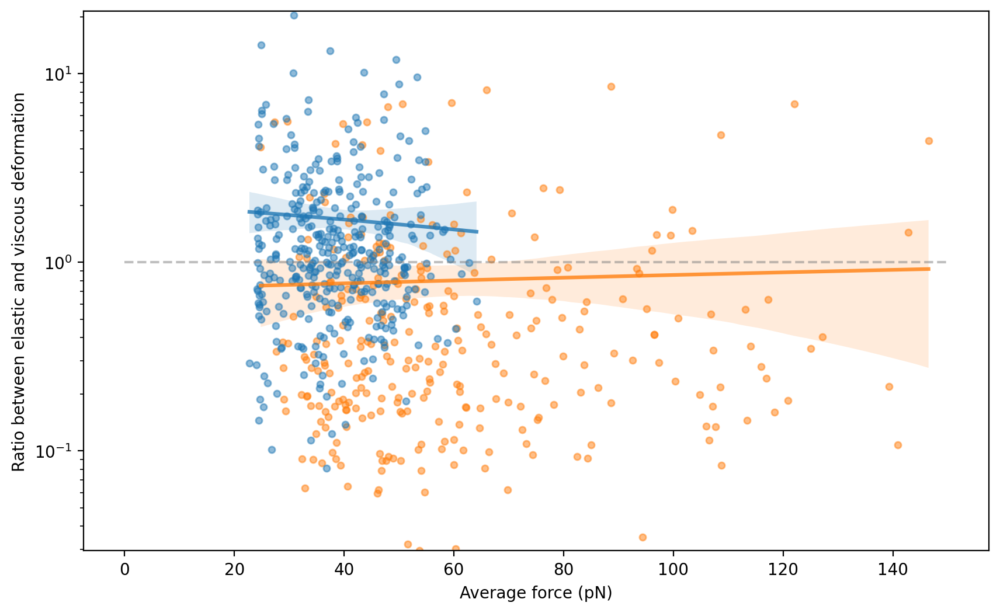

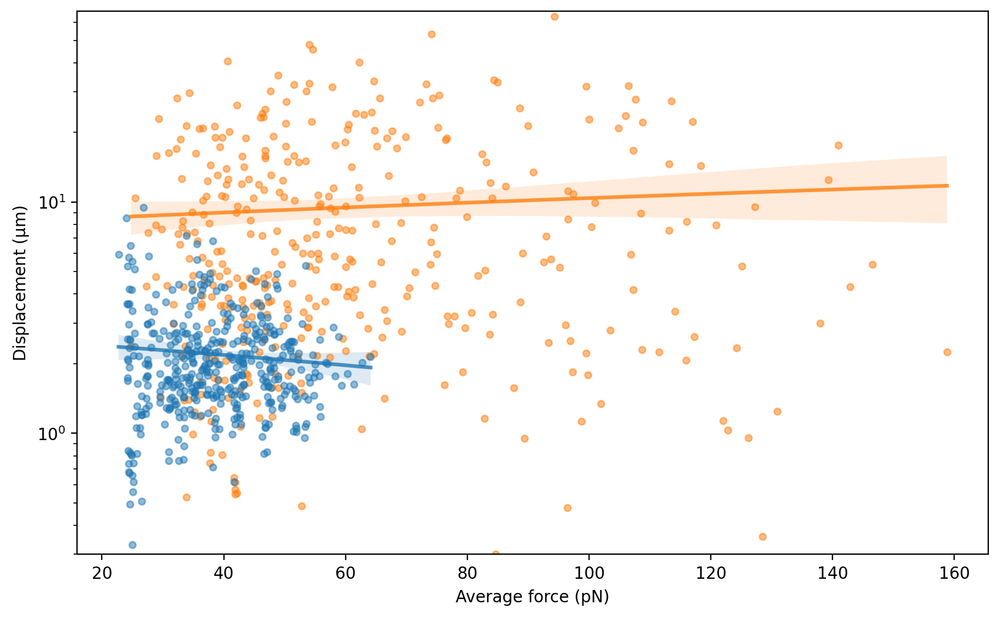

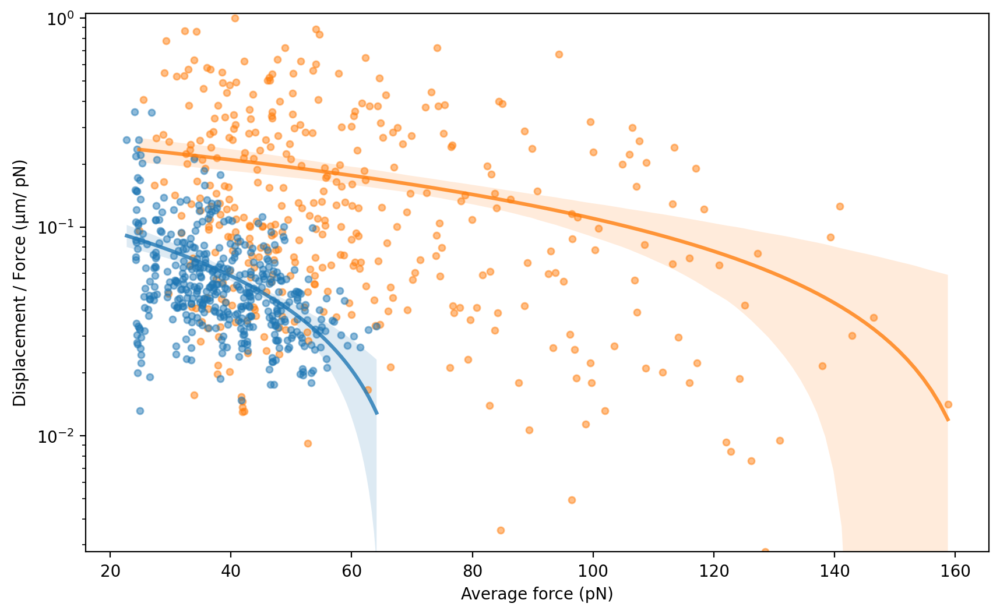

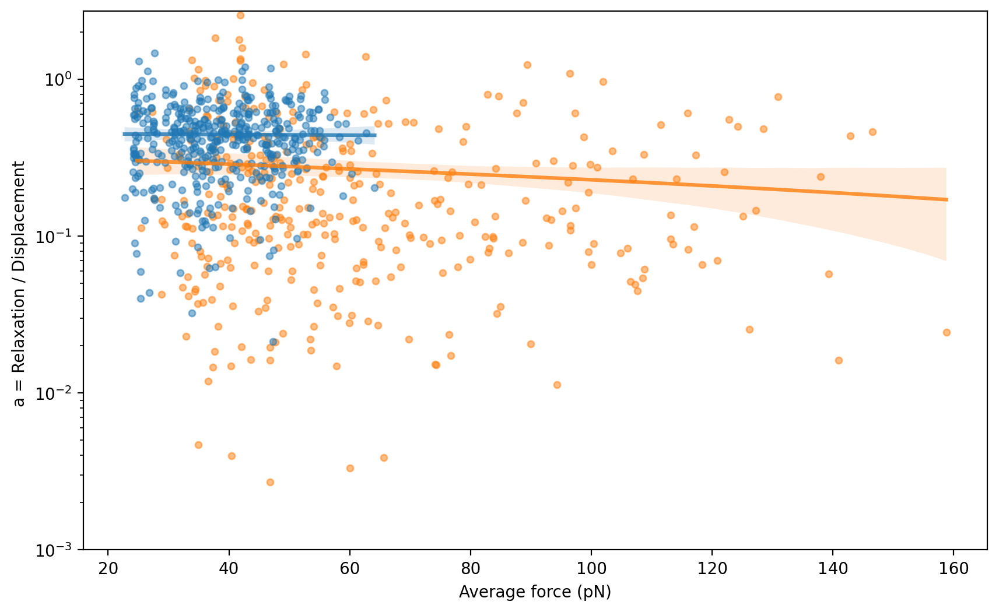

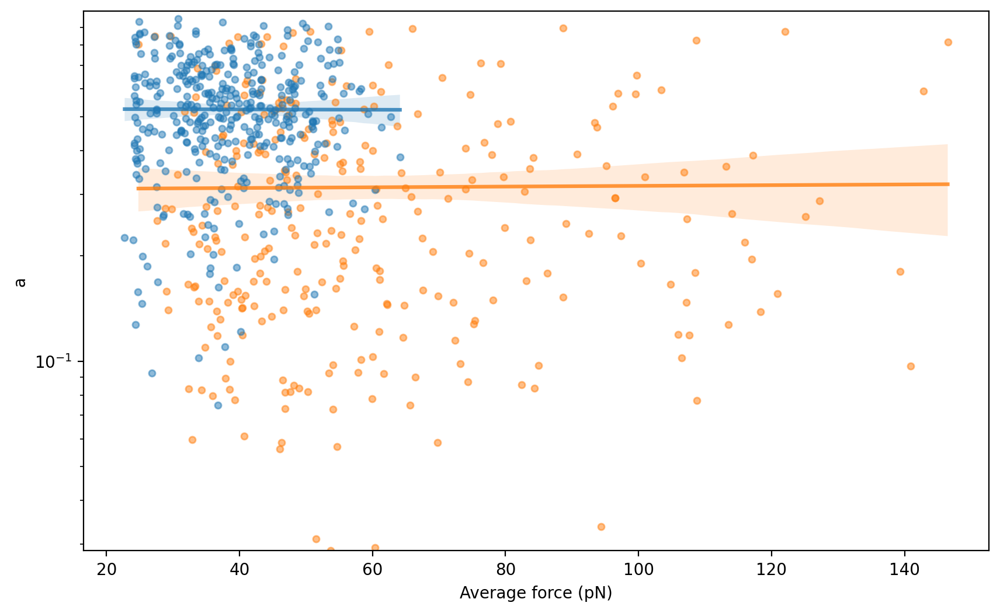

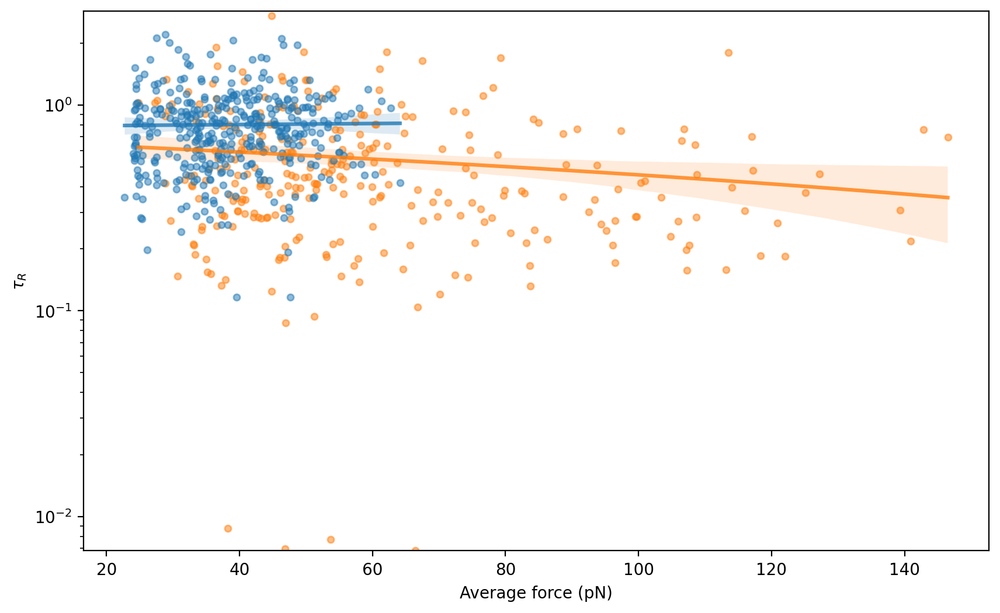

In [119]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot all data
    plt.plot(df.loc[(df['MT_STATUS']=='n'), 'AVG_FORCE'], df.loc[(df['MT_STATUS']=='n'), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4)
    plt.plot(df.loc[(df['MT_STATUS']=='y'), 'AVG_FORCE'], df.loc[(df['MT_STATUS']=='y'), param], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4)
    
    sns.regplot(data=df[(df['MT_STATUS']=='y')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[0], alpha=0.8))

    sns.regplot(data=df[(df['MT_STATUS']=='n')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))

    if param =='elastic_viscous_ratio':
        plt.hlines(1, 0, 150, color='gray', linestyle='--', alpha=0.5)
    
    plt.xlabel('Average force (pN)')
    plt.ylabel(label)
    plt.ylim(bottom=max(df[param].min(), 0.001))
    # plt.xlim(left=0)
    # plt.ylim(bottom=0)
    # plt.xscale('log')
    plt.yscale('log')
    plt.show()

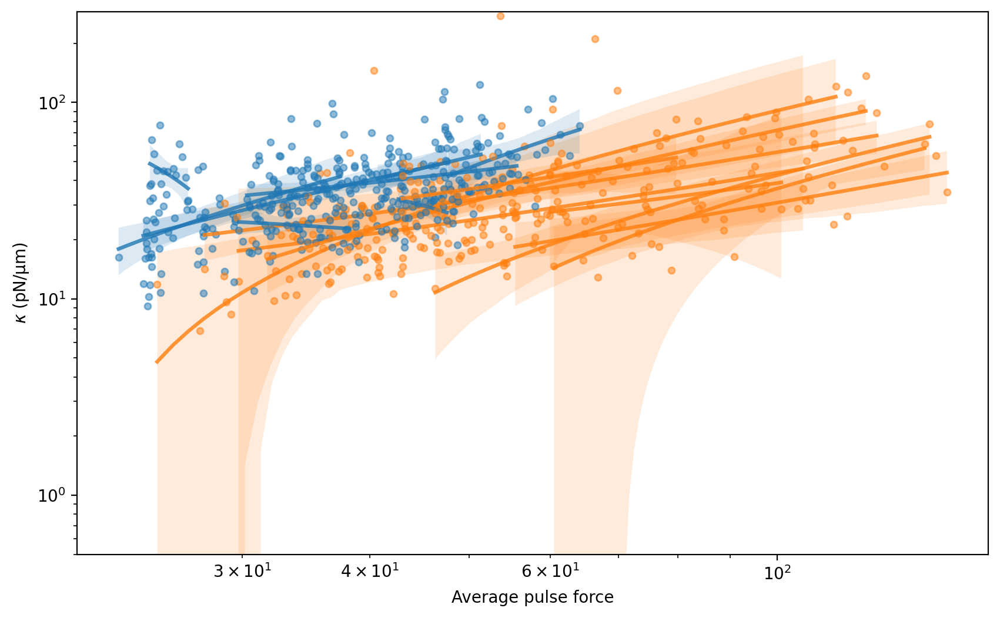

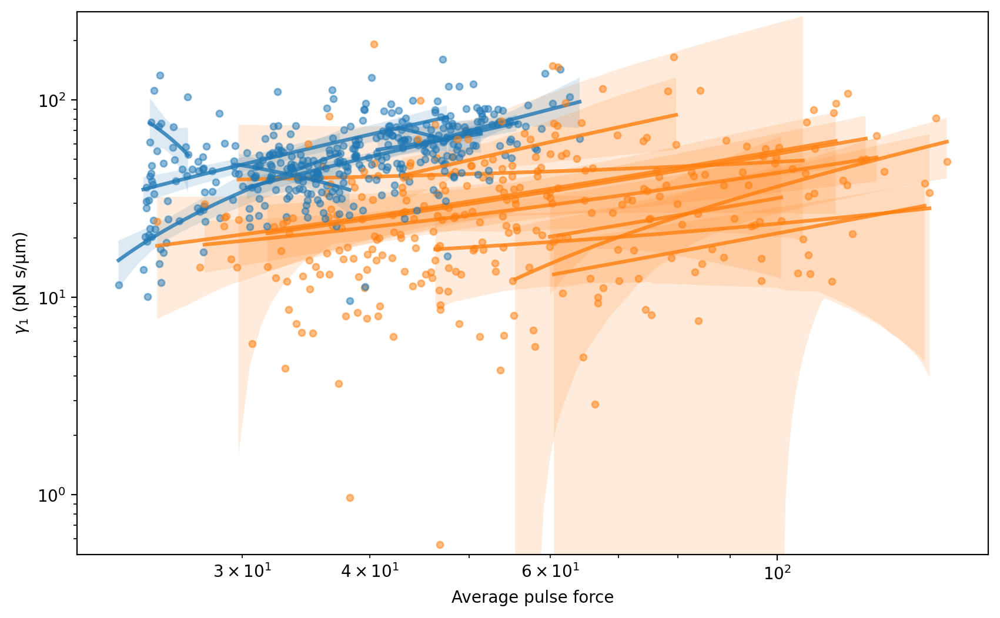

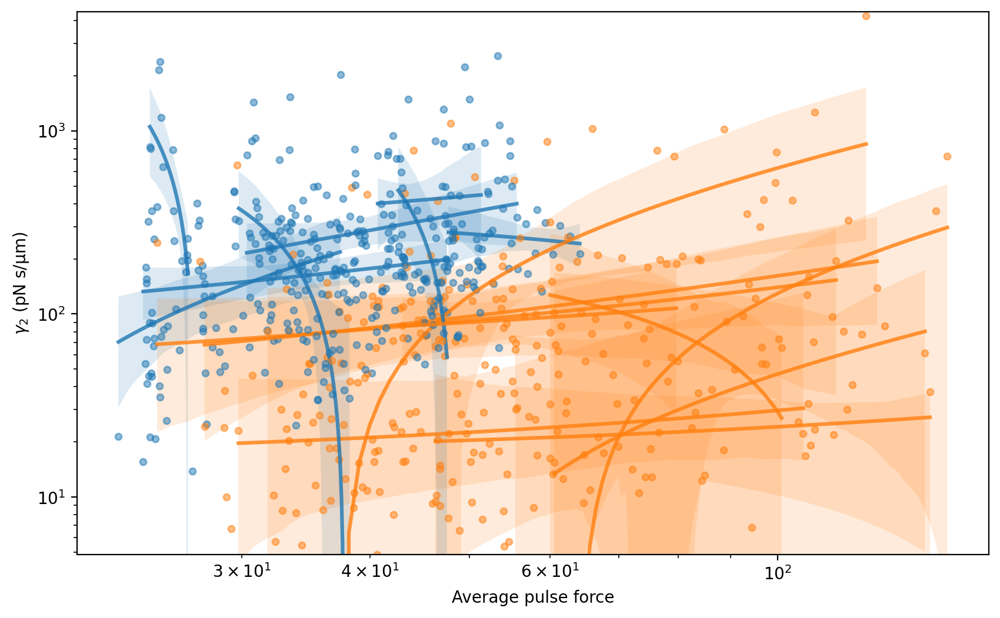

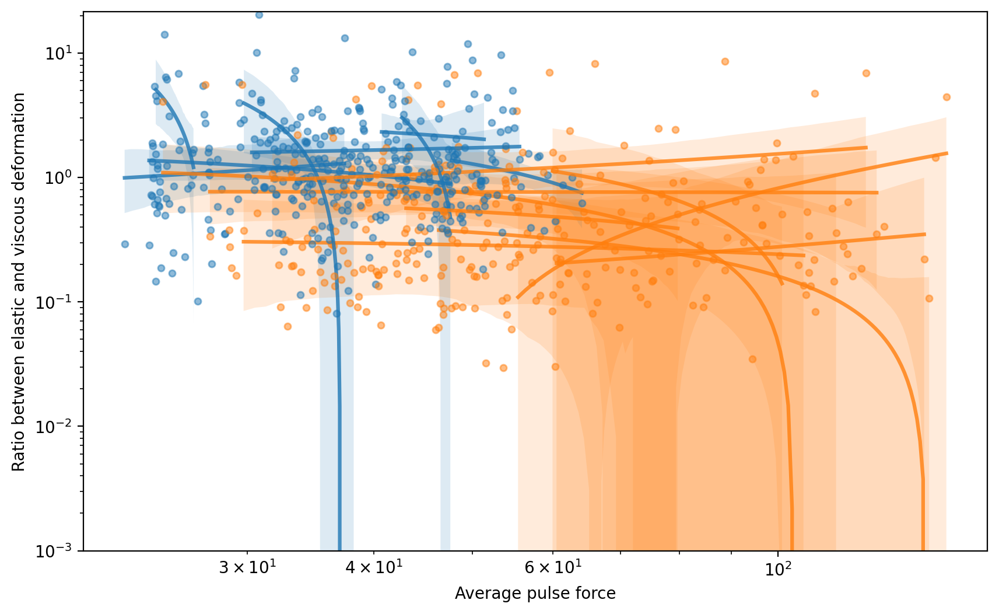

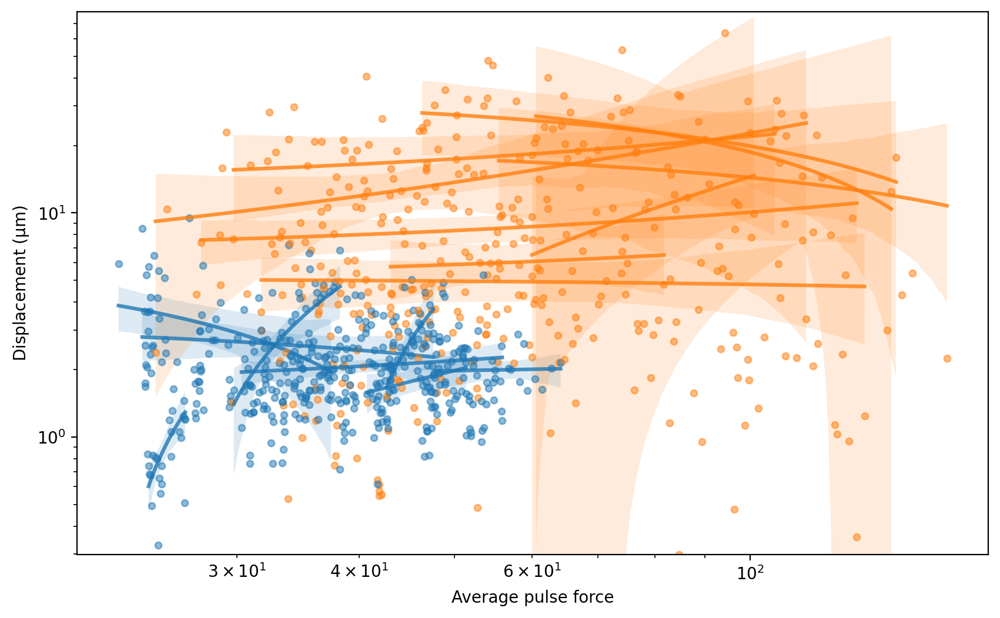

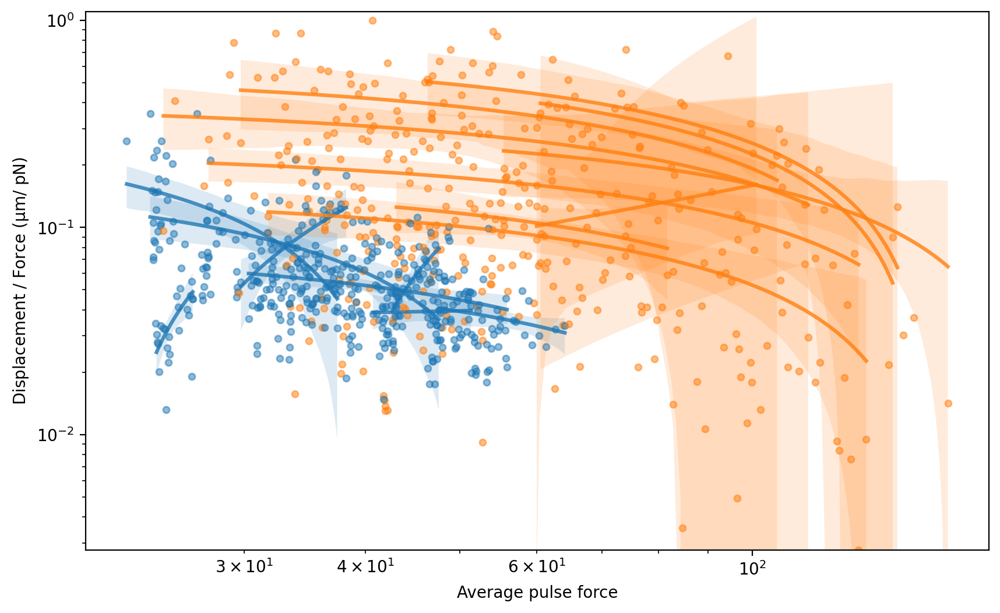

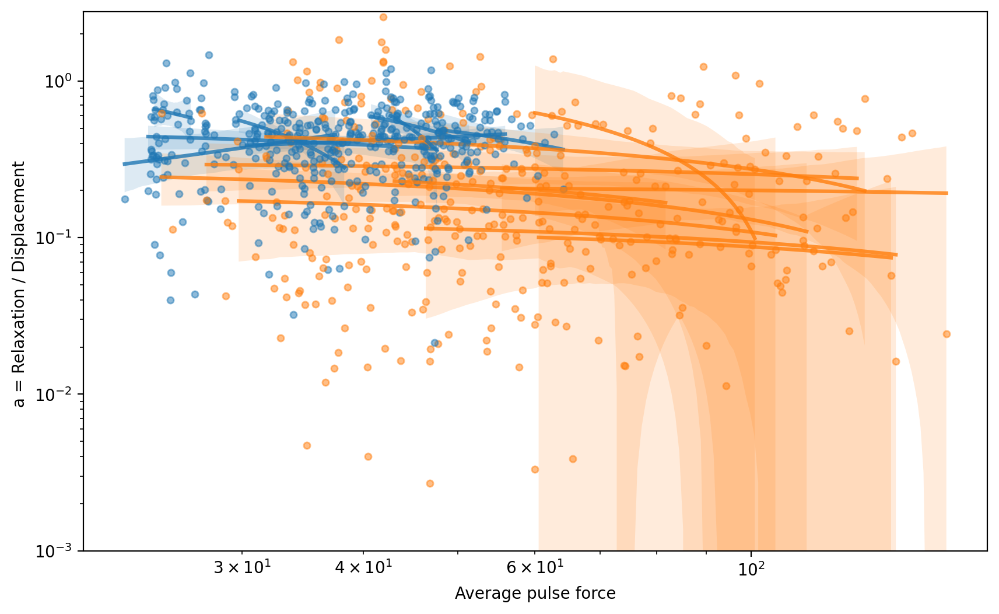

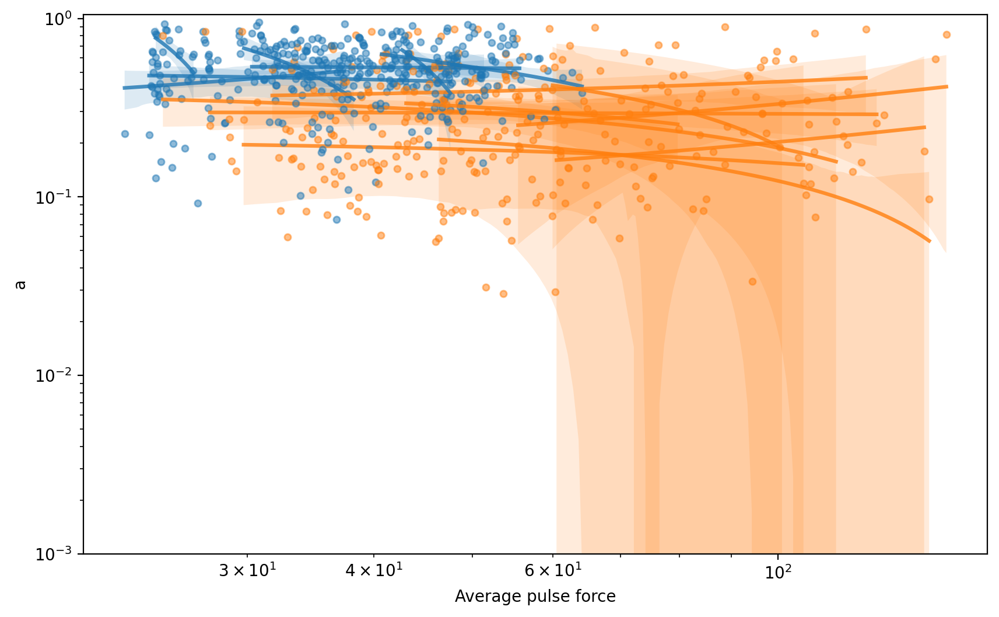

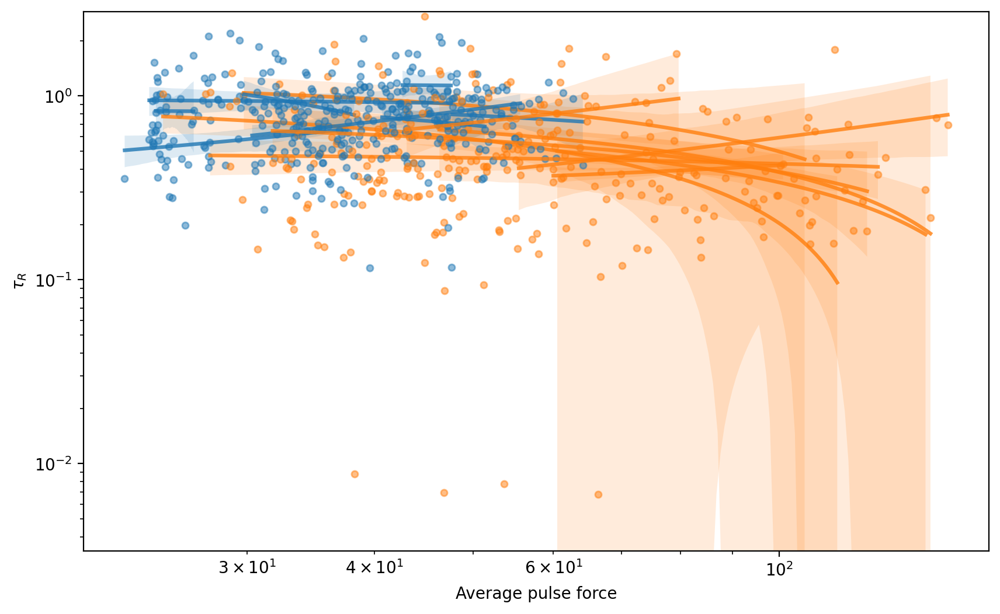

In [120]:
rng = np.random.default_rng()

df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot all data
    for (i, embryo) in enumerate(df['EMBRYO'].unique()):
        plt.plot(df.loc[(df['MT_STATUS']=='n')&(df['EMBRYO']==embryo), 'AVG_FORCE'], df.loc[(df_results_filtered['MT_STATUS']=='n')&(df['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
        plt.plot(df.loc[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo), 'AVG_FORCE'], df.loc[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4, label=embryo)
        
        if len(df[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df[(df['MT_STATUS']=='y')&(df['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[0], alpha=0.8))

        if len(df[(df['MT_STATUS']=='n')&(df['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df[(df['MT_STATUS']=='n')&(df['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))
    
    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

# Binned by the pulse number

There seems to be no significant trend in the measurements from repetitive pulses. Although, there is a slight change from teh first pulse to the rest. 

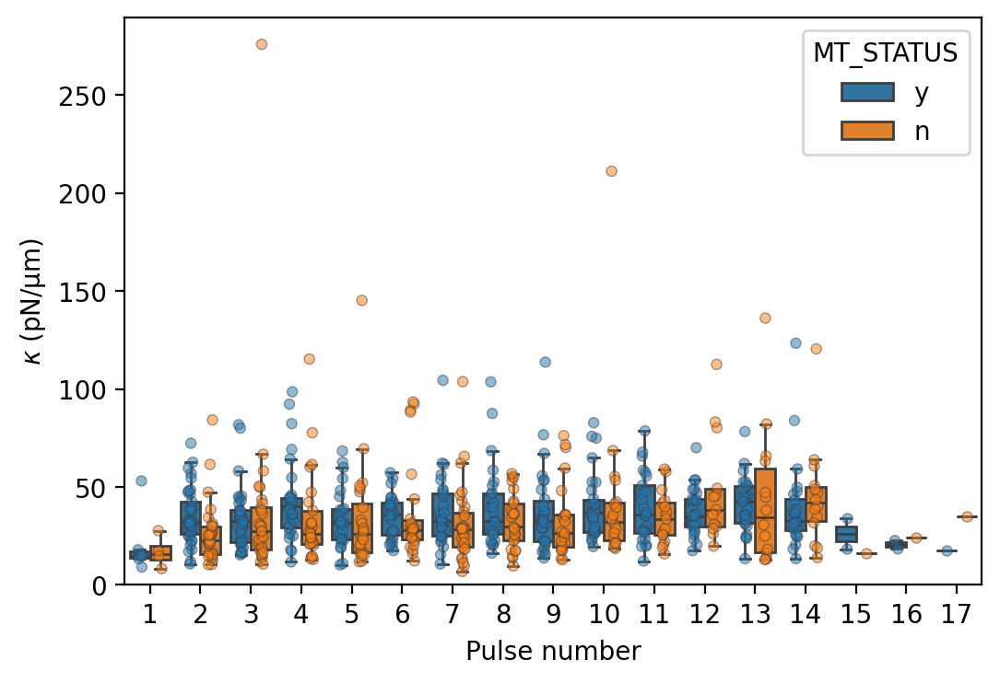

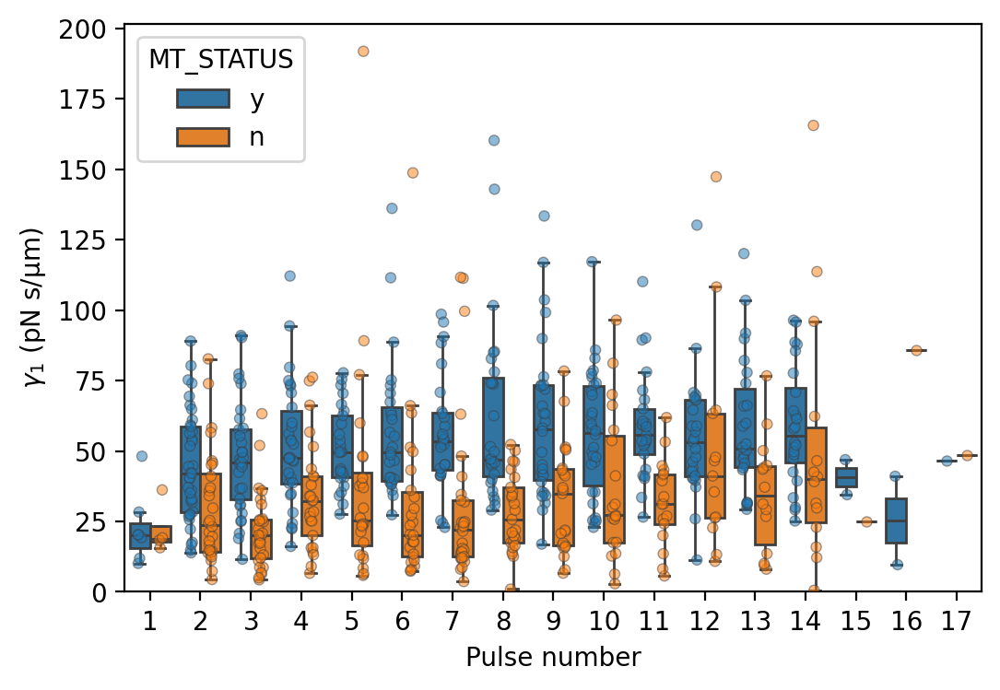

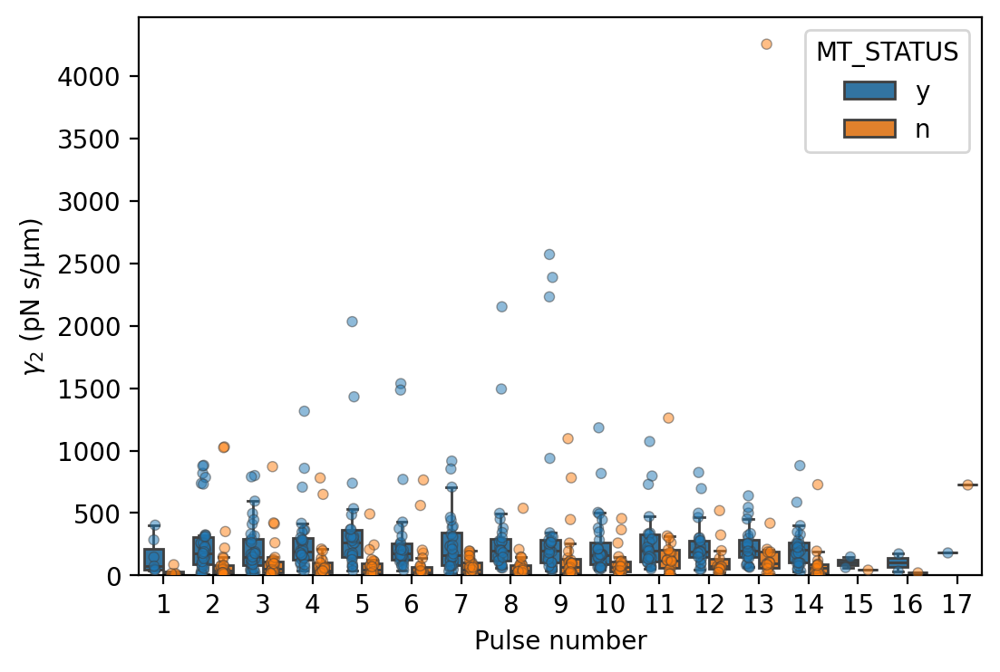

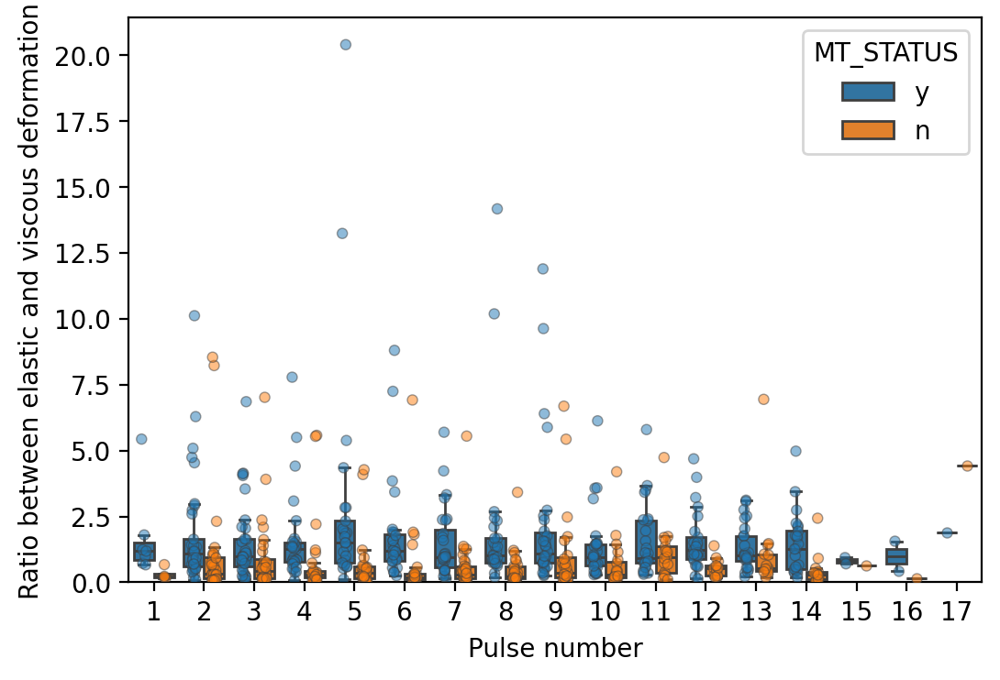

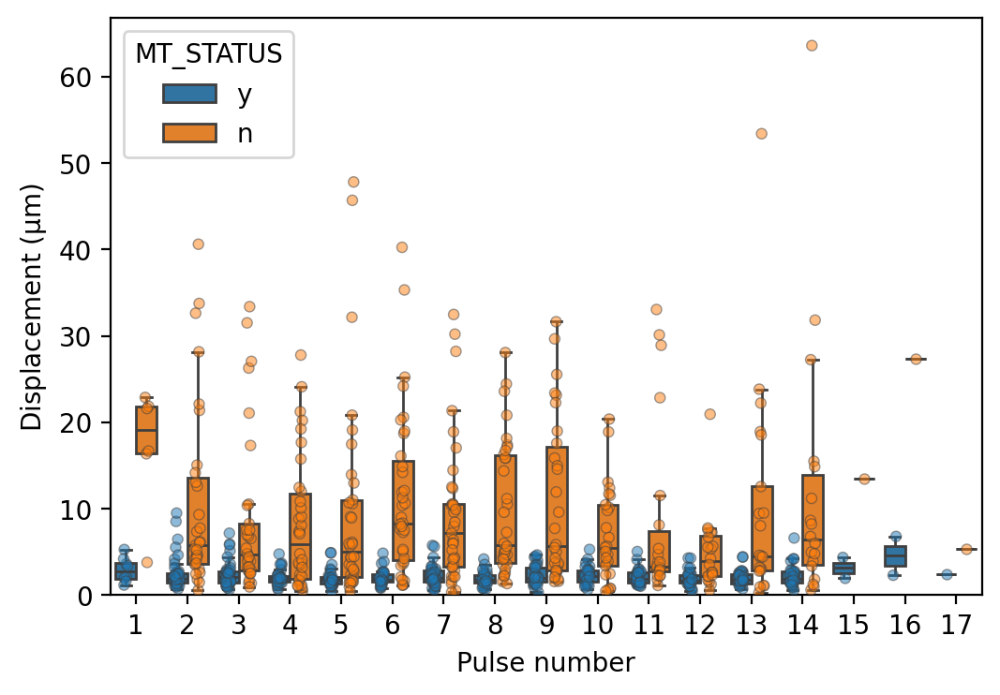

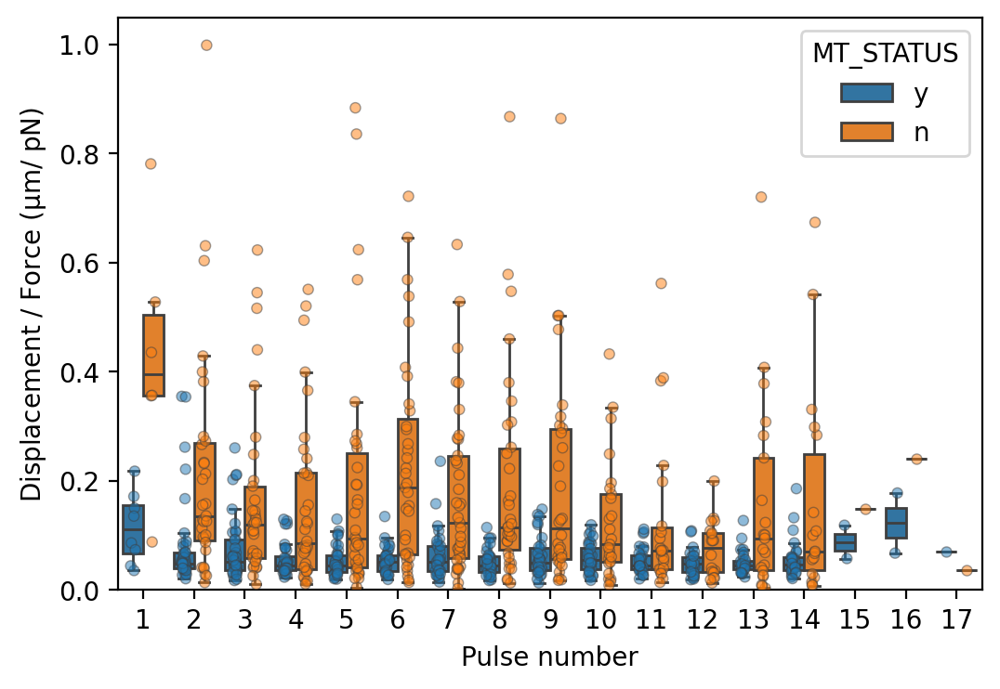

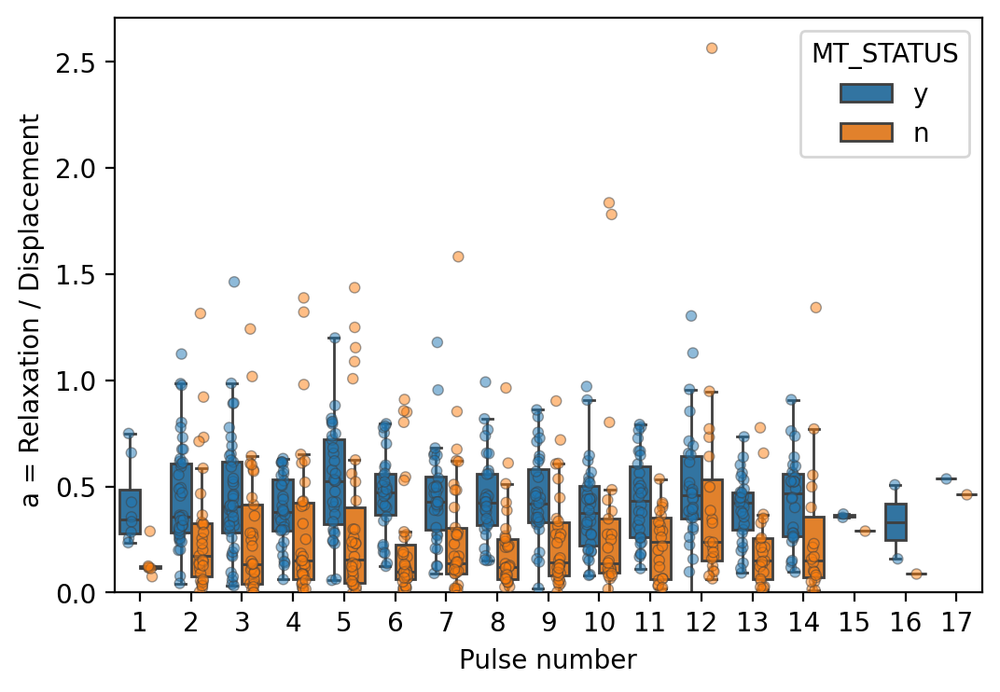

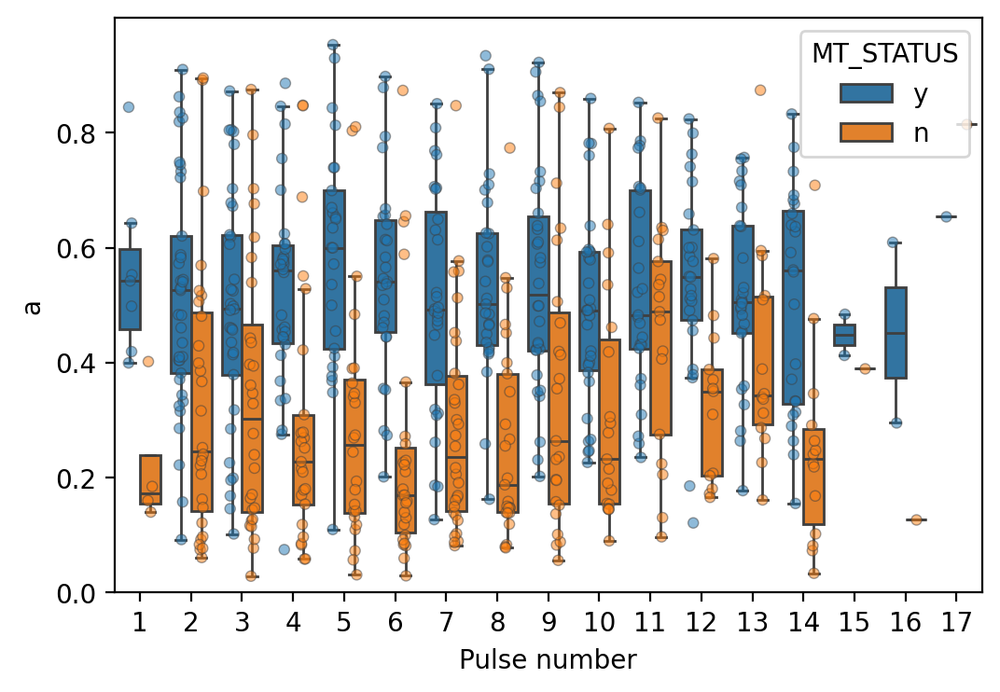

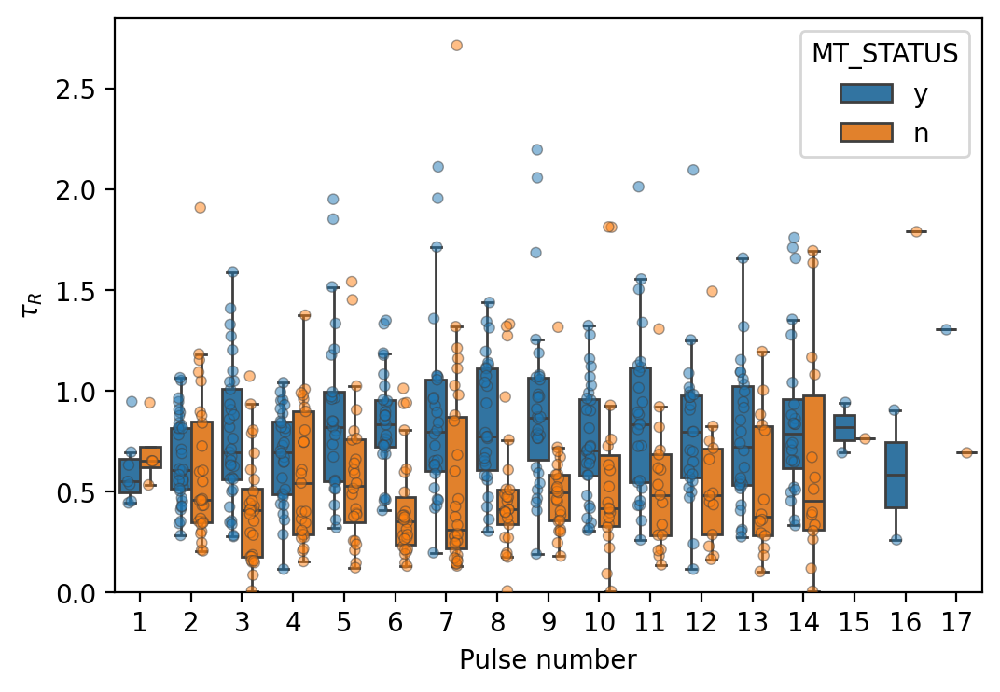

In [121]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    df = df_results_filtered
    if param in ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'a', 'tau_r']:
        df = filter_data_params(df_results_filtered)
    fig = plt.figure(figsize=(6, 4), dpi=200)
    sns.boxplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df, fliersize=0)
    sns.stripplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4)
    plt.xlabel('Pulse number')
    plt.ylabel(label)
    plt.ylim(bottom=0)
    plt.savefig(f'/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/3_plots/results/auxiliary_plots_statistics/{param}_per_pulse.svg', format='svg')

    plt.show()